# Baleen Whale SPUE Analysis

This notebook contains the workflow used to calculate and visualize sightings per unit effort (SPUE) for baleen whales in the Mid-Atlantic Bight using NOAA aerial survey data.

The workflow includes data loading, cleaning, effort-standardized SPUE calculations, seasonal and interannual summaries, depth-binned spatial analyses, heatmaps, statistical comparisons, and figure/table exports.


## Setup and Data Loading

Run this section first. Input paths, output paths, constants, species labels, study bounds, and reusable helper functions are defined before the analysis sections below.


In [1]:
from pathlib import Path

PROJECT_ROOT = Path.cwd()
DATA_DIR = PROJECT_ROOT / "data"
FIGURE_DIR = PROJECT_ROOT / "figures"
OUTPUT_DIR = PROJECT_ROOT / "outputs"

for directory in [DATA_DIR, FIGURE_DIR, OUTPUT_DIR]:
    directory.mkdir(parents=True, exist_ok=True)

LAT_MIN, LAT_MAX = 37.0, 41.5
LON_MIN, LON_MAX = -76.0, -69.0

ON_EFFORT_STAGES = [1, 4]

SEASON_ORDER = ["Winter", "Spring", "Summer", "Fall"]

SPECIES_MAP = {
    "RIWH": "North Atlantic Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale",
}

MAIN_SPECIES = ["FIWH", "HUWH", "RIWH"]

DEPTH_BINS = {
    "Nearshore (<40 m)": (-float("inf"), 40),
    "Midshelf (40-60 m)": (40, 60),
    "Outer shelf (>60 m)": (60, float("inf")),
}


In [2]:
# ============================================================
# GLOBAL IMPORTS + CONSTANTS USED THROUGHOUT THIS NOTEBOOK
# ============================================================
# This cell is meant to be run first after opening the notebook.
# It collects:
#   1) all package imports
#   2) file paths used repeatedly
#   3) shared species / season lookup tables
#   4) the study-region bounding box used in the mapping sections
#
# Keeping these items here makes the rest of the notebook easier to read,
# and it reduces the chance of a later cell failing because an import or
# constant was defined farther down in the notebook.

import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe
import matplotlib.ticker as mticker

from math import radians, sin, cos, sqrt, atan2

from matplotlib.colors import LogNorm, Normalize

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

from scipy.stats import shapiro, levene, f_oneway, kruskal

#  post-hoc / multiple-comparison tools.
# These are not required for the core SPUE calculations.
try:
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    TUKEY_AVAILABLE = True
except ImportError:
    pairwise_tukeyhsd = None
    TUKEY_AVAILABLE = False

try:
    import scikit_posthocs as sphp
    DUNN_AVAILABLE = True
except ImportError:
    sp = None
    DUNN_AVAILABLE = False


def apply_integer_count_colorbar_ticks(cbar, vmax, color=None, nbins=5):
    """
    Format sighting-count colorbars with clean integer ticks.

    Important:
    - This assumes a LINEAR Normalize(vmin=1, vmax=vmax), not LogNorm.
    - The smallest count shown is 1 because hexbin uses mincnt=1.
    - Ticks are calculated from the actual vmax for that figure/row, so
      rare-species rows do not inherit a large scale from another species.
    """
    try:
        vmax_int = int(np.ceil(float(vmax)))
    except Exception:
        vmax_int = 1
    vmax_int = max(1, vmax_int)

    if vmax_int <= 6:
        ticks = np.arange(1, vmax_int + 1, dtype=int)
    else:
        locator = mticker.MaxNLocator(nbins=nbins, integer=True, min_n_ticks=3)
        ticks = locator.tick_values(1, vmax_int)
        ticks = np.array([int(t) for t in ticks if 1 <= t <= vmax_int])
        ticks = np.unique(np.r_[1, ticks, vmax_int]).astype(int)

    cbar.set_ticks(ticks)
    cbar.ax.yaxis.set_major_formatter(mticker.FormatStrFormatter("%d"))

    if color is not None:
        cbar.ax.yaxis.set_tick_params(color=color, labelsize=9)
        plt.setp(cbar.ax.get_yticklabels(), color=color)
        cbar.outline.set_edgecolor(color)

    return cbar

# ------------------------------------------------------------
# Common file paths
# ------------------------------------------------------------
RAW_SURVEY_CSV = "data/mab_request_jan23-oct25_v2.csv"
SPUE_OUTPUT_DIR = Path("outputs/spue_results")
HEATMAP_OUTPUT_DIR = Path("outputs/plot_outputs_heatmaps")

# ------------------------------------------------------------
# Analysis years requested
# ------------------------------------------------------------
# Keep thesis analyses and plots to 2023-2024 only.
# 2025 is deliberately excluded from SPUE calculations, statistics, and plots.
ANALYSIS_YEARS = [2023, 2024]
ANALYSIS_START = "2023-01-01"
ANALYSIS_END = "2024-12-31"


# ------------------------------------------------------------
# Study region used for thesis heatmaps / spatial products
# ------------------------------------------------------------
LAT_MIN = 37.0
LAT_MAX = 41.5
LON_MIN = -76.0
LON_MAX = -69.0

# ------------------------------------------------------------
# Shared lookup objects used in multiple cells
# ------------------------------------------------------------
BALEEN_CODES = ["FIWH", "HUWH", "MIWH", "RIWH", "SEWH", "BLWH"]

SPECIES_MAP = {
    "RIWH": "Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale",
    "TOTAL": "Total Baleen Whales",
}

SEASON_ORDER = ["W", "Sp", "Su", "F"]

SEASON_LABELS = {
    "W": "Winter",
    "Sp": "Spring",
    "Su": "Summer",
    "F": "Fall",
}

YEAR_ORDER = [2023, 2024]

In [3]:
# ============================================================
# 1. LOAD + CLEAN NOAA SURVEY DATA
# ============================================================

# update this path to your actual file
csv_path = RAW_SURVEY_CSV

NOAA_Survey_Data = pd.read_csv(csv_path)

# replicate the R datetime parsing logic as closely as possible
# R version rebuilds DATETIME_ET using substrings, so we do same here
dt_raw = NOAA_Survey_Data["DATETIME_ET"].astype(str)

rebuilt_dt = (
    dt_raw.str.slice(0, 9) + " " +
    dt_raw.str.slice(10, 18) + " " +
    dt_raw.str.slice(29, 31)
)

NOAA_Survey_Data["Date"] = pd.to_datetime(
    rebuilt_dt,
    format="%d-%b-%y %I.%M.%S %p",
    errors="coerce"
)

NOAA_Survey_Data["Day"] = NOAA_Survey_Data["Date"].dt.floor("D")


# Filter the raw survey table immediately so downstream products cannot
# accidentally reintroduce 2025.
NOAA_Survey_Data = NOAA_Survey_Data[
    NOAA_Survey_Data["Day"].dt.year.isin(ANALYSIS_YEARS)
].copy()

# match R rename
if "GROUP_SIZE" in NOAA_Survey_Data.columns:
    NOAA_Survey_Data = NOAA_Survey_Data.rename(columns={"GROUP_SIZE": "n"})

NOAA_Survey_Data = NOAA_Survey_Data.sort_values("Date").reset_index(drop=True)

In [4]:
# ============================================================
# UTILITY FUNCTION USED BY TRACK PLOTS
# ============================================================
# This is kept because later map/track plotting cells use it to remove
# long jumps between points.
#
# It is NOT used here to rebuild the precomputed leg-distance file.

def haversine_km(lon1, lat1, lon2, lat2):
    R = 6371.0  # Earth radius in kilometers

    lon1, lat1, lon2, lat2 = map(
        np.radians,
        [lon1, lat1, lon2, lat2]
    )

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = (
        np.sin(dlat / 2.0) ** 2
        + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0) ** 2
    )

    c = 2 * np.arcsin(np.sqrt(a))
    return R * c

In [5]:
# ============================================================
# LOAD PRECOMPUTED LEG DISTANCES
# ============================================================
# This replaces the old cells that rebuilt leg distances from latitude/longitude.
# It preserves the original downstream variable name:
#     NOAA_Survey_Distances_Leg
#
# The rest of the notebook can therefore keep using the original logic and names.

possible_leg_distance_paths = [
    Path("data/NOAA_Survey_Distances_Leg.csv"),
    SPUE_OUTPUT_DIR / "NOAA_Survey_Distances_Leg.csv",
    Path("data/NOAA_Survey_Data_With_Leg_Distances.csv"),
    SPUE_OUTPUT_DIR / "data/NOAA_Survey_Data_With_Leg_Distances.csv",
]

leg_distance_path = None
for path in possible_leg_distance_paths:
    if path.exists():
        leg_distance_path = path
        break

if leg_distance_path is None:
    raise FileNotFoundError(
        "Could not find a precomputed leg-distance file. Expected one of:\n"
        + "\n".join(str(path) for path in possible_leg_distance_paths)
    )

# latin1 handles the non-breaking-space / Excel-style encoding issue you hit earlier.
loaded_leg_distances = pd.read_csv(leg_distance_path, encoding="latin1")

loaded_leg_distances["Day"] = pd.to_datetime(
    loaded_leg_distances["Day"],
    errors="coerce"
)

# If the file is already the leg-distance summary, use it directly.
if {"Day", "PLANE", "LEGTYPE", "LEGSTAGE", "dist_km"}.issubset(loaded_leg_distances.columns):
    NOAA_Survey_Distances_Leg = loaded_leg_distances[
        ["Day", "PLANE", "LEGTYPE", "LEGSTAGE", "dist_km"]
    ].copy()

# If the file is the joined survey table, collapse it back to the original
# leg-distance summary expected by the rest of the notebook.
else:
    possible_distance_cols = [
        "dist_km",
        "leg_distance_km",
        "Leg_Distance_km",
        "distance_km",
        "Distance_km",
        "dist",
        "distance",
    ]

    distance_col = None
    for col in possible_distance_cols:
        if col in loaded_leg_distances.columns:
            distance_col = col
            break

    if distance_col is None:
        raise KeyError(
            "Could not find a distance column in the precomputed file. "
            "Expected one of: " + ", ".join(possible_distance_cols)
        )

    NOAA_Survey_Distances_Leg = (
        loaded_leg_distances
        .groupby(["Day", "PLANE", "LEGTYPE", "LEGSTAGE"], as_index=False)
        .agg(dist_km=(distance_col, "sum"))
    )

# Keep thesis analyses to the original 2023-2024 analysis years.
NOAA_Survey_Distances_Leg = NOAA_Survey_Distances_Leg[
    NOAA_Survey_Distances_Leg["Day"].dt.year.isin(ANALYSIS_YEARS)
].copy()

NOAA_Survey_Distances_Leg = (
    NOAA_Survey_Distances_Leg
    .sort_values(["Day", "PLANE", "LEGTYPE", "LEGSTAGE"])
    .reset_index(drop=True)
)

print(f"Loaded precomputed leg distances from: {leg_distance_path}")
print(NOAA_Survey_Distances_Leg.head())

Loaded precomputed leg distances from: outputs\spue_results\NOAA_Survey_Distances_Leg.csv
         Day               PLANE  LEGTYPE  LEGSTAGE     dist_km
0 2023-01-08  TWIN OTTER NOAA 56        1         1  121.733767
1 2023-01-08  TWIN OTTER NOAA 56        1         5   47.286029
2 2023-01-08  TWIN OTTER NOAA 56        4         3  298.912766
3 2023-01-08  TWIN OTTER NOAA 56        6         1  269.261596
4 2023-01-08  TWIN OTTER NOAA 56        6         4  277.090117


In [6]:
# ============================================================
# 5. JOIN LEG DISTANCES BACK TO THE ORIGINAL DATASET
# ============================================================

NOAA_Survey_Data_With_Leg_Distances = NOAA_Survey_Data.merge(
    NOAA_Survey_Distances_Leg,
    on=["Day", "PLANE", "LEGTYPE", "LEGSTAGE"],
    how="left"
)

In [7]:


# ============================================================
# 6. CREATE DAILY SURVEY EFFORT
# ============================================================

# Your SPUE R script expects a daily_effort table with Day + effort_km.
# Since sightings are filtered to LEGSTAGE 1 and 4, the matching effort
# should also be based on those same stages.

daily_effort = (
    NOAA_Survey_Distances_Leg[
        NOAA_Survey_Distances_Leg["LEGSTAGE"].isin([1, 4])
    ]
    .groupby("Day", as_index=False)
    .agg(effort_km=("dist_km", "sum"))
    .sort_values("Day")
    .reset_index(drop=True)
)

# : total daily distance regardless of effort stage
daily_distance_total = (
    NOAA_Survey_Distances_Leg
    .groupby("Day", as_index=False)
    .agg(total_dist_km=("dist_km", "sum"))
    .sort_values("Day")
    .reset_index(drop=True)
)

# : combine both for diagnostics
daily_effort_summary = daily_effort.merge(
    daily_distance_total,
    on="Day",
    how="outer"
).sort_values("Day").reset_index(drop=True)

In [8]:

# ============================================================
# 7. CREATE DAILY SIGHTINGS FOR SPUE
# ============================================================

# Use the shared baleen whale code list defined in the import/constants cell.
baleen_codes = BALEEN_CODES

sightings_input = NOAA_Survey_Data[
    NOAA_Survey_Data["LEGSTAGE"].isin([1, 4]) &
    NOAA_Survey_Data["SPCODE"].isin(baleen_codes)
].copy()

# daily sightings by species
daily_sightings_species = (
    sightings_input
    .groupby(["Day", "SPCODE"], as_index=False)
    .size()
    .rename(columns={"size": "sightings"})
)

# daily total sightings across all baleen whales
daily_sightings_total = (
    sightings_input
    .groupby("Day", as_index=False)
    .size()
    .rename(columns={"size": "sightings"})
)

daily_sightings_total["SPCODE"] = "TOTAL"

# combine
daily_sightings_all = pd.concat(
    [daily_sightings_species, daily_sightings_total],
    ignore_index=True
)

In [9]:
# ============================================================
# 9. CALCULATE DAILY SPUE
# ============================================================
# SPUE here = sightings per unit effort, where effort is the daily
# on-effort distance surveyed in kilometers.
#
# Numerator:
#   daily_sightings_all -> number of sightings per Day x SPCODE
#
# Denominator:
#   daily_effort -> kilometers surveyed on-effort per day
#
# The merge below aligns those two tables by Day so each daily sighting
# count is paired with the correct daily effort value.

spue_dataset = daily_sightings_all.merge(
    daily_effort,
    on="Day",
    how="left"
)

# Add year and month now so they do not need to be rebuilt later
# for plotting, summaries, or seasonal statistical tests.
spue_dataset["year"] = spue_dataset["Day"].dt.year
spue_dataset["month"] = spue_dataset["Day"].dt.month

def assign_season(month):
    """Convert month number to thesis season code."""
    if month in [12, 1, 2]:
        return "W"
    elif month in [3, 4, 5]:
        return "Sp"
    elif month in [6, 7, 8]:
        return "Su"
    elif month in [9, 10, 11]:
        return "F"
    return pd.NA

# Build the seasonal grouping field used later for:
#   - seasonal summaries
#   - seasonal boxplots
#   - within-year seasonal tests
spue_dataset["season"] = spue_dataset["month"].apply(assign_season)

# Compute sightings per kilometer of effort.
# np.where is used here as a safe vectorized "if/else":
#   if effort_km > 0 -> sightings / effort_km
#   otherwise        -> NaN
#
# This prevents divide-by-zero errors on days with zero or missing effort.
spue_dataset["spue"] = np.where(
    spue_dataset["effort_km"] > 0,
    spue_dataset["sightings"] / spue_dataset["effort_km"],
    np.nan
)

# Sort for readability so the saved CSV is easy to inspect manually.
spue_dataset = spue_dataset.sort_values(["Day", "SPCODE"]).reset_index(drop=True)

In [10]:
# ============================================================
# 10. CALCULATE SEASONAL SPUE
# ============================================================
# This cell aggregates the daily SPUE inputs up to the
# year x season x species level.
#
# Important:
# We do NOT average daily SPUE values directly here.
# Instead we first sum:
#   - total sightings within the season
#   - total effort_km within the season
# and then compute:
#   seasonal SPUE = seasonal sightings / seasonal effort
#
# That gives a properly effort-weighted seasonal rate.

seasonal_spue_dataset = (
    spue_dataset
    .groupby(["year", "season", "SPCODE"], as_index=False)
    .agg(
        sightings=("sightings", "sum"),
        effort_km=("effort_km", "sum")
    )
)

# Convert the aggregated seasonal totals into a seasonal SPUE value.
# Again we protect against divide-by-zero in case a grouped row somehow
# has zero effort.
seasonal_spue_dataset["spue"] = np.where(
    seasonal_spue_dataset["effort_km"] > 0,
    seasonal_spue_dataset["sightings"] / seasonal_spue_dataset["effort_km"],
    np.nan
)

seasonal_spue_dataset = (
    seasonal_spue_dataset
    .sort_values(["year", "season", "SPCODE"])
    .reset_index(drop=True)
)

In [11]:
# --------------------------------------------------
# Define output folder
# --------------------------------------------------

output_dir = SPUE_OUTPUT_DIR

# create folder if it doesn't exist
output_dir.mkdir(parents=True, exist_ok=True)

# --------------------------------------------------
# Save files to that folder
# --------------------------------------------------

NOAA_Survey_Distances_Leg.to_csv(
    output_dir / "NOAA_Survey_Distances_Leg.csv",
    index=False
)

NOAA_Survey_Data_With_Leg_Distances.to_csv(
    output_dir / "NOAA_Survey_Data_With_Leg_Distances.csv",
    index=False
)

daily_effort.to_csv(
    output_dir / "daily_effort.csv",
    index=False
)

daily_distance_total.to_csv(
    output_dir / "daily_distance_total.csv",
    index=False
)

daily_effort_summary.to_csv(
    output_dir / "daily_effort_summary.csv",
    index=False
)

spue_dataset.to_csv(
    output_dir / "spue_dataset.csv",
    index=False
)

seasonal_spue_dataset.to_csv(
    output_dir / "seasonal_spue_dataset.csv",
    index=False
)

print(f"Files saved to: {output_dir.resolve()}")

Files saved to: C:\moo_program\outputs\spue_results


In [12]:

# ============================================================
# 12. QUICK CHECKS
# ============================================================

print("\nDaily effort preview:")
print(daily_effort.head())

print("\nSPUE dataset preview:")
print(spue_dataset.head(20))

print("\nSPUE summary:")
print(spue_dataset["spue"].describe())

print("\nSeasonal SPUE preview:")
print(seasonal_spue_dataset.head())


Daily effort preview:
         Day    effort_km
0 2023-01-08   668.085480
1 2023-01-11   576.666300
2 2023-01-19   871.008926
3 2023-02-06   855.236350
4 2023-02-07  1874.578198

SPUE dataset preview:
          Day SPCODE  sightings    effort_km  year  month season      spue
0  2023-01-08   RIWH          3   668.085480  2023      1      W  0.004490
1  2023-01-08  TOTAL          3   668.085480  2023      1      W  0.004490
2  2023-01-11   RIWH          2   576.666300  2023      1      W  0.003468
3  2023-01-11  TOTAL          2   576.666300  2023      1      W  0.003468
4  2023-01-19   FIWH          1   871.008926  2023      1      W  0.001148
5  2023-01-19   RIWH          3   871.008926  2023      1      W  0.003444
6  2023-01-19  TOTAL          4   871.008926  2023      1      W  0.004592
7  2023-02-07   RIWH          1  1874.578198  2023      2      W  0.000533
8  2023-02-07  TOTAL          1  1874.578198  2023      2      W  0.000533
9  2023-02-08   FIWH          1   810.491026  20

Plots will be saved to: outputs\plot_outputs_spue_species
Saved: outputs\plot_outputs_spue_species\spue_boxplot_2023.png


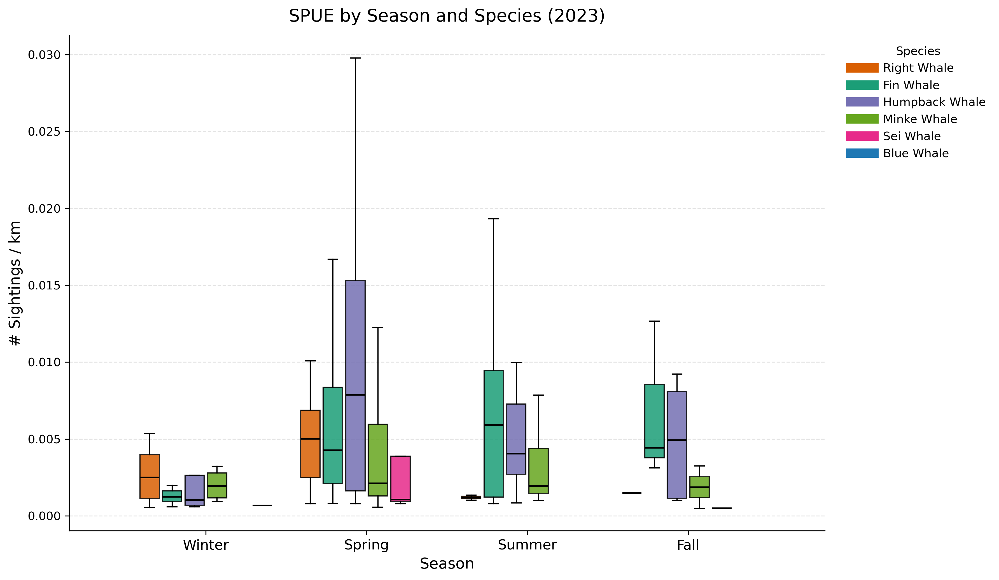

Saved: outputs\plot_outputs_spue_species\spue_boxplot_2024.png


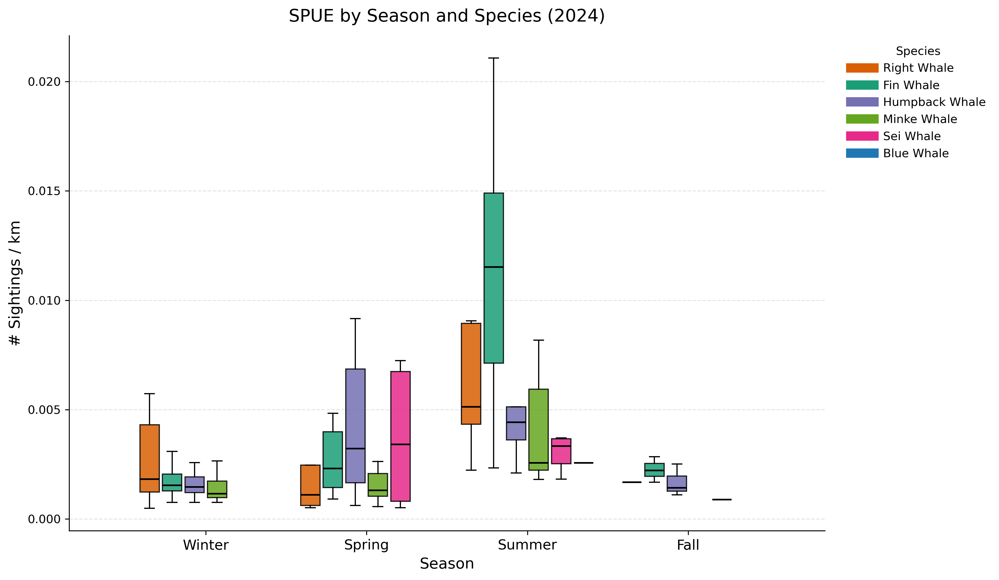

In [13]:
# --------------------------------------------------
# load data
# --------------------------------------------------
df = pd.read_csv("outputs/spue_results/spue_dataset.csv")

# keep only years of interest
df = df[df["year"].isin([2023, 2024])].copy()

# remove TOTAL row for species boxplots
df = df[df["SPCODE"] != "TOTAL"].copy()

# --------------------------------------------------
# map species codes to names
# --------------------------------------------------
species_map = {
    "RIWH": "Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale"
}

df["species"] = df["SPCODE"].map(species_map)

# drop anything unexpected
df = df[df["species"].notna()].copy()

# --------------------------------------------------
# create output folder for plots
# --------------------------------------------------
PLOT_DIR = Path("outputs/plot_outputs_spue_species")
PLOT_DIR.mkdir(exist_ok=True)

print("Plots will be saved to:", PLOT_DIR)

# --------------------------------------------------
# ordering
# --------------------------------------------------
season_order = ["W", "Sp", "Su", "F"]
season_labels = {
    "W": "Winter",
    "Sp": "Spring",
    "Su": "Summer",
    "F": "Fall"
}

species_order = [
    "Right Whale",
    "Fin Whale",
    "Humpback Whale",
    "Minke Whale",
    "Sei Whale",
    "Blue Whale"
]

df["season"] = pd.Categorical(
    df["season"],
    categories=season_order,
    ordered=True
)

df = df.sort_values(["year", "season", "species"])

# --------------------------------------------------
# species colors
# --------------------------------------------------
species_colors = {
    "Right Whale": "#d95f02",
    "Fin Whale": "#1b9e77",
    "Humpback Whale": "#7570b3",
    "Minke Whale": "#66a61e",
    "Sei Whale": "#e7298a",
    "Blue Whale": "#1f78b4"
}

default_color = "#999999"

# --------------------------------------------------
# plot loop
# --------------------------------------------------
years = sorted(df["year"].unique())

for yr in years:

    yr_df = df[df["year"] == yr].copy()

    fig, ax = plt.subplots(figsize=(12, 7), dpi=300)

    base_positions = np.arange(len(season_order))
    n_species = len(species_order)

    offsets = np.linspace(-0.35, 0.35, n_species)
    width = 0.12

    legend_handles = []

    for i, species in enumerate(species_order):

        positions = base_positions + offsets[i]
        species_data = []

        for s in season_order:
            vals = yr_df.loc[
                (yr_df["season"] == s) &
                (yr_df["species"] == species),
                "spue"
            ].dropna().values

            # matplotlib boxplot does not like empty arrays
            # use [np.nan] so spacing stays consistent
            if len(vals) == 0:
                vals = [np.nan]

            species_data.append(vals)

        bp = ax.boxplot(
            species_data,
            positions=positions,
            widths=width,
            patch_artist=True,
            showfliers=False,
            medianprops=dict(color="black", linewidth=1.4),
            whiskerprops=dict(linewidth=1.0),
            capprops=dict(linewidth=1.0),
            boxprops=dict(linewidth=1.0)
        )

        color = species_colors.get(species, default_color)

        for patch in bp["boxes"]:
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        legend_handles.append(
            plt.Line2D(
                [0], [0],
                color=color,
                lw=8,
                label=species
            )
        )

    # --------------------------------------------------
    # formatting
    # --------------------------------------------------
    ax.set_xticks(base_positions)
    ax.set_xticklabels(
        [season_labels[s] for s in season_order],
        fontsize=12
    )

    ax.set_ylabel("# Sightings / km", fontsize=13)
    ax.set_xlabel("Season", fontsize=13)

    ax.set_title(
        f"SPUE by Season and Species ({yr})",
        fontsize=15,
        pad=12
    )

    # uncomment if you want log scale again
    # ax.set_yscale("log")

    ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.legend(
        handles=legend_handles,
        title="Species",
        frameon=False,
        bbox_to_anchor=(1.02, 1),
        loc="upper left"
    )

    plt.tight_layout()

    # --------------------------------------------------
    # save figure
    # --------------------------------------------------
    outfile = PLOT_DIR / f"spue_boxplot_{yr}.png"
    plt.savefig(outfile, dpi=300, bbox_inches="tight")
    print("Saved:", outfile)

    # --------------------------------------------------
    # show figure in notebook
    # --------------------------------------------------
    plt.show()

Saved: outputs\plot_outputs_spue_species\spue_boxplot_2023_2024_shared_y_truemax_topright.png


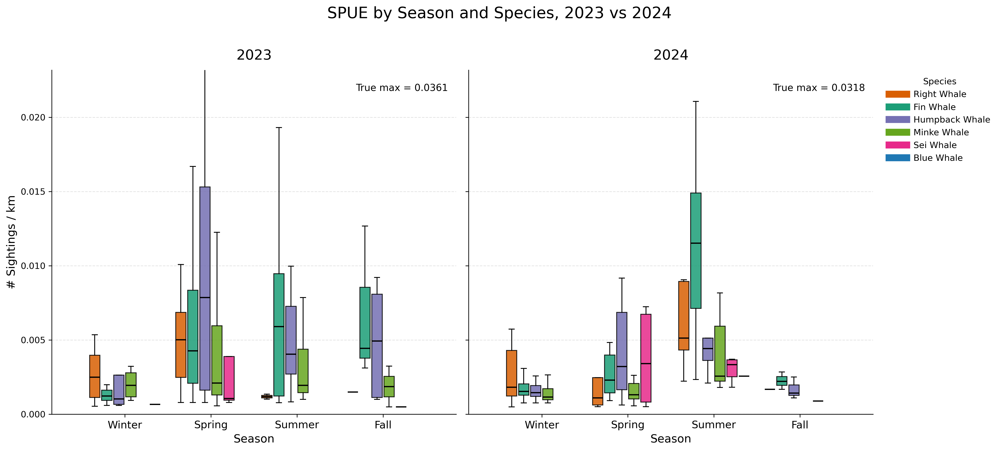

In [14]:
# --------------------------------------------------
# combined plot: 2023 and 2024 side-by-side
# shared y-axis based on the 2024 displayed boxplot range
# true max shown in TOP RIGHT
# --------------------------------------------------

years = [2023, 2024]

base_positions = np.arange(len(season_order))
n_species = len(species_order)

offsets = np.linspace(-0.35, 0.35, n_species)
width = 0.12

# --------------------------------------------------
# get y-limit from the 2024 plotted boxplot whiskers
# this matches showfliers=False better than using the full true max
# --------------------------------------------------
yr_2024_df = df[df["year"] == 2024].copy()

whisker_max_2024 = 0

for species in species_order:
    for s in season_order:
        vals = yr_2024_df.loc[
            (yr_2024_df["season"] == s) &
            (yr_2024_df["species"] == species),
            "spue"
        ].dropna().values

        if len(vals) > 0:
            q1 = np.percentile(vals, 25)
            q3 = np.percentile(vals, 75)
            iqr = q3 - q1
            upper_fence = q3 + 1.5 * iqr

            whisker_vals = vals[vals <= upper_fence]

            if len(whisker_vals) > 0:
                whisker_max_2024 = max(whisker_max_2024, whisker_vals.max())

# add headroom
y_display_max = whisker_max_2024 * 1.10

# fallback
if y_display_max == 0 or np.isnan(y_display_max):
    y_display_max = yr_2024_df["spue"].max() * 1.10

# --------------------------------------------------
# figure
# --------------------------------------------------
fig, axes = plt.subplots(
    nrows=1,
    ncols=2,
    figsize=(16, 7),
    dpi=300,
    sharey=True
)

legend_handles = []

for ax, yr in zip(axes, years):

    yr_df = df[df["year"] == yr].copy()

    for i, species in enumerate(species_order):

        positions = base_positions + offsets[i]
        species_data = []

        for s in season_order:
            vals = yr_df.loc[
                (yr_df["season"] == s) &
                (yr_df["species"] == species),
                "spue"
            ].dropna().values

            if len(vals) == 0:
                vals = [np.nan]

            species_data.append(vals)

        color = species_colors.get(species, default_color)

        bp = ax.boxplot(
            species_data,
            positions=positions,
            widths=width,
            patch_artist=True,
            showfliers=False,
            medianprops=dict(color="black", linewidth=1.4),
            whiskerprops=dict(linewidth=1.0),
            capprops=dict(linewidth=1.0),
            boxprops=dict(linewidth=1.0)
        )

        for patch in bp["boxes"]:
            patch.set_facecolor(color)
            patch.set_alpha(0.85)

        if yr == 2023:
            legend_handles.append(
                plt.Line2D(
                    [0], [0],
                    color=color,
                    lw=8,
                    label=species
                )
            )

    # --------------------------------------------------
    # formatting
    # --------------------------------------------------
    ax.set_ylim(0, y_display_max)

    ax.set_xticks(base_positions)
    ax.set_xticklabels(
        [season_labels[s] for s in season_order],
        fontsize=12
    )

    ax.set_xlabel("Season", fontsize=13)
    ax.set_title(str(yr), fontsize=16, pad=12)

    ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    # TRUE MAX IN TOP RIGHT
    true_max = yr_df["spue"].max()

    ax.text(
        0.98,
        0.96,
        f"True max = {true_max:.4f}",
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=11,
        bbox=dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.8,
            pad=3
        )
    )

axes[0].set_ylabel("# Sightings / km", fontsize=13)

fig.suptitle(
    "SPUE by Season and Species, 2023 vs 2024",
    fontsize=18,
    y=1.02
)

axes[1].legend(
    handles=legend_handles,
    title="Species",
    frameon=False,
    bbox_to_anchor=(1.02, 1),
    loc="upper left"
)

plt.tight_layout()

outfile = PLOT_DIR / "spue_boxplot_2023_2024_shared_y_truemax_topright.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight")
print("Saved:", outfile)

plt.show()

   year season  sightings
0  2023      W         70
1  2023     Sp        394
2  2023     Su        165
3  2023      F         62
4  2024      W        111
5  2024     Sp        286
6  2024     Su        243
7  2024      F         11
Plots will be saved to: outputs\plot_outputs_total_whales
Saved: outputs\plot_outputs_total_whales\total_whales_barplot_2023.png


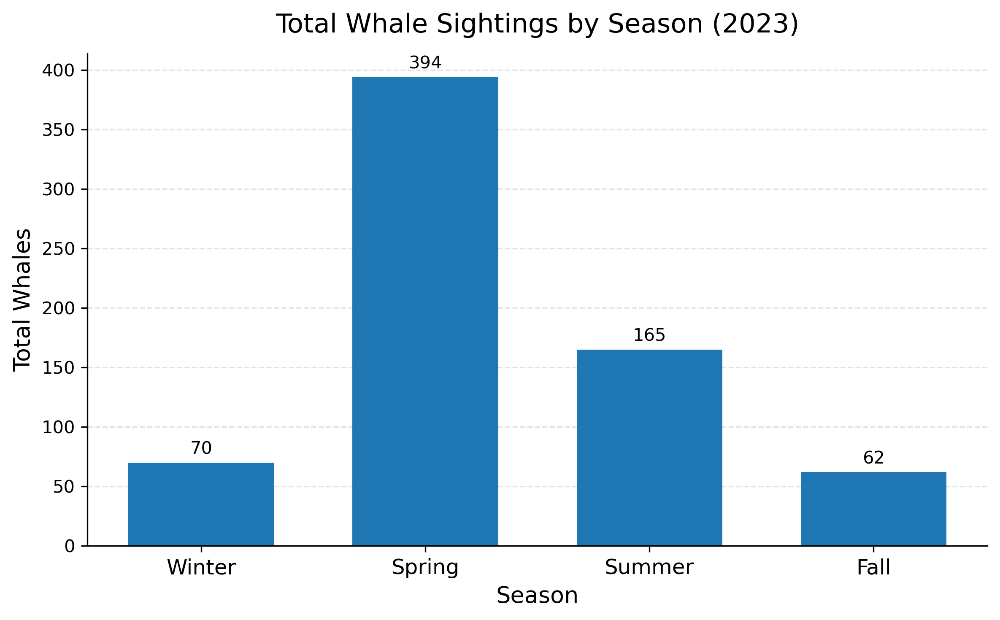

Saved: outputs\plot_outputs_total_whales\total_whales_barplot_2024.png


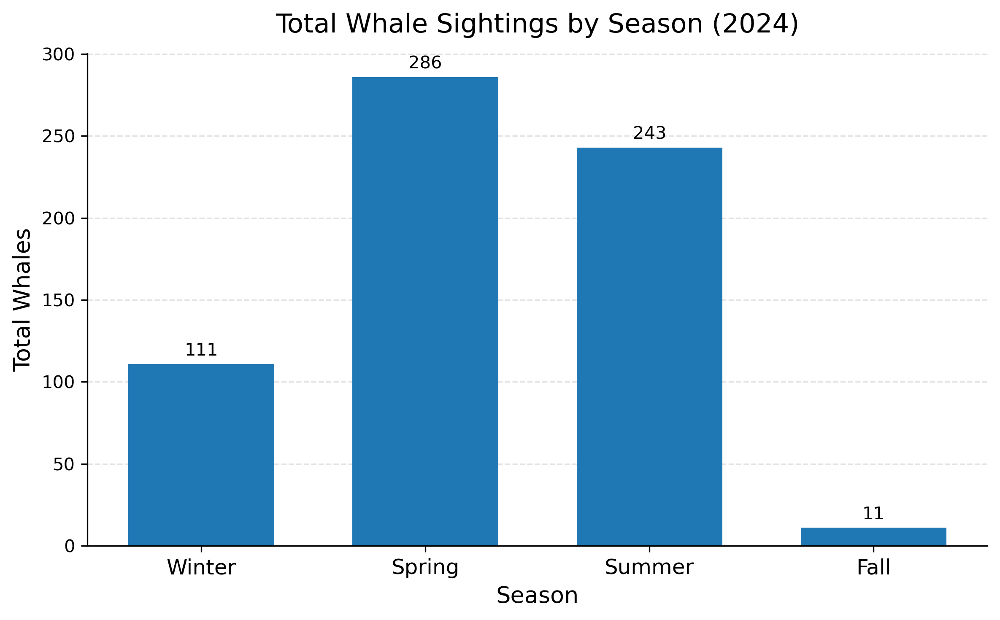

In [15]:
# --------------------------------------------------
# load data
# --------------------------------------------------
df = pd.read_csv("outputs/spue_results/spue_dataset.csv")

# keep only years of interest
df = df[df["year"].isin([2023, 2024])].copy()

# keep only TOTAL rows
df = df[df["SPCODE"] == "TOTAL"].copy()

# --------------------------------------------------
# season order
# --------------------------------------------------
season_order = ["W", "Sp", "Su", "F"]
season_labels = {
    "W": "Winter",
    "Sp": "Spring",
    "Su": "Summer",
    "F": "Fall"
}

df["season"] = pd.Categorical(
    df["season"],
    categories=season_order,
    ordered=True
)

# --------------------------------------------------
# aggregate to total whales by season and year
# --------------------------------------------------
seasonal_total = (
    df.groupby(["year", "season"], as_index=False)["sightings"]
      .sum()
      .sort_values(["year", "season"])
)

print(seasonal_total)

# --------------------------------------------------
# create output folder
# --------------------------------------------------
PLOT_DIR = Path("outputs/plot_outputs_total_whales")
PLOT_DIR.mkdir(exist_ok=True)

print("Plots will be saved to:", PLOT_DIR)

# --------------------------------------------------
# plot loop
# --------------------------------------------------
years = sorted(seasonal_total["year"].unique())

for yr in years:
    yr_df = seasonal_total[seasonal_total["year"] == yr].copy()

    # make sure all seasons appear even if missing
    yr_df = yr_df.set_index("season").reindex(season_order).reset_index()
    yr_df["year"] = yr
    yr_df["sightings"] = yr_df["sightings"].fillna(0)

    fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

    x = np.arange(len(season_order))
    ax.bar(x, yr_df["sightings"], width=0.65)

    ax.set_xticks(x)
    ax.set_xticklabels([season_labels[s] for s in season_order], fontsize=12)

    ax.set_ylabel("Total Whales", fontsize=13)
    ax.set_xlabel("Season", fontsize=13)
    ax.set_title(f"Total Whale Sightings by Season ({yr})", fontsize=15, pad=12)

    ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    #  value labels
    for i, val in enumerate(yr_df["sightings"]):
        ax.text(i, val + max(yr_df["sightings"]) * 0.01, f"{int(val)}",
                ha="center", va="bottom", fontsize=10)

    plt.tight_layout()

    outfile = PLOT_DIR / f"total_whales_barplot_{yr}.png"
    plt.savefig(outfile, dpi=300, bbox_inches="tight")
    print("Saved:", outfile)

    plt.show()

In [16]:
# --------------------------------------------------
# load raw survey file
# --------------------------------------------------
df = pd.read_csv(RAW_SURVEY_CSV, low_memory=False)

# spatial boundary box
LAT_MIN = 37.0
LAT_MAX = 41.5
LON_MIN = -76.0
LON_MAX = -69.0

df = df[
    (df["LATITUDE"] >= LAT_MIN) &
    (df["LATITUDE"] <= LAT_MAX) &
    (df["LONGITUDE"] >= LON_MIN) &
    (df["LONGITUDE"] <= LON_MAX)
].copy()

# --------------------------------------------------
# clean key fields
# --------------------------------------------------
df["SPCODE"] = df["SPCODE"].astype(str).str.strip().str.upper()
df["GROUP_SIZE"] = pd.to_numeric(df["GROUP_SIZE"], errors="coerce")
df["SIGHTING_NUMBER"] = pd.to_numeric(df["SIGHTING_NUMBER"], errors="coerce")

# parse NOAA datetime format
df["datetime"] = pd.to_datetime(
    df["DATETIME_ET"],
    format="%d-%b-%y %I.%M.%S.%f %p",
    errors="coerce"
)

df["date"] = df["datetime"].dt.floor("D")
df["year"] = df["datetime"].dt.year
df["month"] = df["datetime"].dt.month

# Keep thesis outputs to 2023-2024 only.
df = df[df["year"].isin(ANALYSIS_YEARS)].copy()

# --------------------------------------------------
# define seasons
# --------------------------------------------------
df["season"] = df["month"].map({
    12: "W", 1: "W", 2: "W",
    3: "Sp", 4: "Sp", 5: "Sp",
    6: "Su", 7: "Su", 8: "Su",
    9: "F", 10: "F", 11: "F"
})

# --------------------------------------------------
# baleen whale species
# --------------------------------------------------
species_map = {
    "RIWH": "Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale"
}

df = df[df["SPCODE"].isin(species_map.keys())].copy()
df["species"] = df["SPCODE"].map(species_map)

# --------------------------------------------------
# keep one row per sighting
# --------------------------------------------------
# SIGHTING_NUMBER is the actual sighting ID, so use that
# and keep the first record for each unique sighting
sightings = (
    df.sort_values("datetime")
      .dropna(subset=["date", "SIGHTING_NUMBER", "GROUP_SIZE"])
      .drop_duplicates(subset=["date", "SIGHTING_NUMBER", "SPCODE"])
      .copy()
)

print("Unique baleen whale sightings kept:", len(sightings))

# --------------------------------------------------
# build seasonal total individual whales by species
# --------------------------------------------------
seasonal_individuals = (
    sightings.groupby(["year", "season", "SPCODE", "species"], as_index=False)["GROUP_SIZE"]
            .sum()
            .rename(columns={"GROUP_SIZE": "total_individual_whales"})
            .sort_values(["year", "season", "species"])
)

print(seasonal_individuals.head(20))
print("Rows:", len(seasonal_individuals))

seasonal_individuals.to_csv(SPUE_OUTPUT_DIR / "seasonal_individual_whales_by_species.csv", index=False)
print("Saved: seasonal_individual_whales_by_species.csv")

Unique baleen whale sightings kept: 2210
    year season SPCODE         species  total_individual_whales
0   2023      F   BLWH      Blue Whale                      1.0
1   2023      F   FIWH       Fin Whale                     44.0
2   2023      F   HUWH  Humpback Whale                     29.0
3   2023      F   MIWH     Minke Whale                      2.0
4   2023      F   RIWH     Right Whale                      3.0
5   2023     Sp   FIWH       Fin Whale                     59.0
6   2023     Sp   HUWH  Humpback Whale                    274.0
7   2023     Sp   MIWH     Minke Whale                     52.0
8   2023     Sp   RIWH     Right Whale                    649.0
9   2023     Sp   SEWH       Sei Whale                     66.0
10  2023     Su   FIWH       Fin Whale                    111.0
11  2023     Su   HUWH  Humpback Whale                     80.0
12  2023     Su   MIWH     Minke Whale                     20.0
13  2023     Su   RIWH     Right Whale                      8.0

Plots will be saved to: outputs\plot_outputs_total_individual_whales_grouped
Saved: outputs\plot_outputs_total_individual_whales_grouped\total_individual_whales_grouped_2023.png


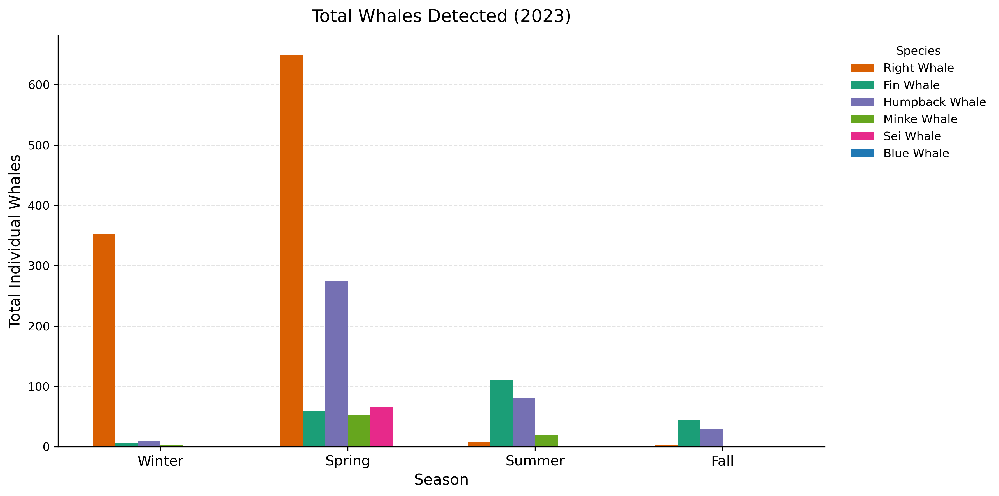

Saved: outputs\plot_outputs_total_individual_whales_grouped\total_individual_whales_grouped_2024.png


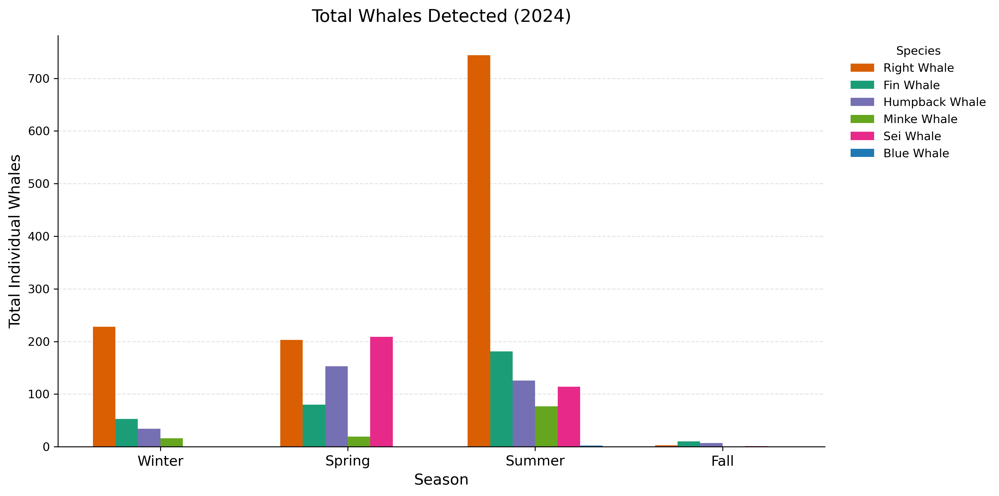

In [17]:
# --------------------------------------------------
# load seasonal individuals dataset
# --------------------------------------------------
df = pd.read_csv("outputs/spue_results/seasonal_individual_whales_by_species.csv")

df = df[df["year"].isin([2023, 2024])].copy()

# --------------------------------------------------
# ordering
# --------------------------------------------------
season_order = ["W", "Sp", "Su", "F"]
season_labels = {
    "W": "Winter",
    "Sp": "Spring",
    "Su": "Summer",
    "F": "Fall"
}

species_order = [
    "Right Whale",
    "Fin Whale",
    "Humpback Whale",
    "Minke Whale",
    "Sei Whale",
    "Blue Whale"
]

species_colors = {
    "Right Whale": "#d95f02",
    "Fin Whale": "#1b9e77",
    "Humpback Whale": "#7570b3",
    "Minke Whale": "#66a61e",
    "Sei Whale": "#e7298a",
    "Blue Whale": "#1f78b4"
}

# --------------------------------------------------
# output folder
# --------------------------------------------------
PLOT_DIR = Path("outputs/plot_outputs_total_individual_whales_grouped")
PLOT_DIR.mkdir(exist_ok=True)

print("Plots will be saved to:", PLOT_DIR)

# --------------------------------------------------
# make one plot per year
# --------------------------------------------------
years = sorted(df["year"].unique())

for yr in years:
    yr_df = df[df["year"] == yr].copy()

    pivot_df = (
        yr_df.pivot(index="season", columns="species", values="total_individual_whales")
             .reindex(season_order)
             .fillna(0)
    )

    for sp in species_order:
        if sp not in pivot_df.columns:
            pivot_df[sp] = 0

    pivot_df = pivot_df[species_order]

    fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

    x = np.arange(len(season_order))
    n_species = len(species_order)
    width = 0.12
    offsets = np.linspace(-0.3, 0.3, n_species)

    for i, sp in enumerate(species_order):
        ax.bar(
            x + offsets[i],
            pivot_df[sp].values,
            width=width,
            label=sp,
            color=species_colors[sp]
        )

    ax.set_xticks(x)
    ax.set_xticklabels([season_labels[s] for s in season_order], fontsize=12)

    ax.set_ylabel("Total Individual Whales", fontsize=13)
    ax.set_xlabel("Season", fontsize=13)
    ax.set_title(f"Total Whales Detected ({yr})", fontsize=15, pad=12)

    ax.grid(axis="y", linestyle="--", alpha=0.35)
    ax.set_axisbelow(True)

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    ax.legend(
        title="Species",
        frameon=False,
        bbox_to_anchor=(1.02, 1),
        loc="upper left"
    )

    plt.tight_layout()

    outfile = PLOT_DIR / f"total_individual_whales_grouped_{yr}.png"
    plt.savefig(outfile, dpi=300, bbox_inches="tight")
    print("Saved:", outfile)

    plt.show()

In [18]:
# ----------------------------
# load data
# ----------------------------
spue_df = pd.read_csv("outputs/spue_results/spue_dataset.csv")
seasonal_spue_df = pd.read_csv("outputs/spue_results/seasonal_spue_dataset.csv")
effort_df = pd.read_csv("outputs/spue_results/daily_effort_summary.csv")

# make sure dates are parsed
spue_df["Day"] = pd.to_datetime(spue_df["Day"])
effort_df["Day"] = pd.to_datetime(effort_df["Day"])

# : cleaner species names
species_map = {
    "RIWH": "Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale",
    "TOTAL": "Total Baleen Whales"
}

spue_df["Species"] = spue_df["SPCODE"].map(species_map).fillna(spue_df["SPCODE"])
seasonal_spue_df["Species"] = seasonal_spue_df["SPCODE"].map(species_map).fillna(seasonal_spue_df["SPCODE"])

# Keep thesis summaries to 2023-2024 only.
spue_df = spue_df[spue_df["year"].isin(ANALYSIS_YEARS)].copy()
seasonal_spue_df = seasonal_spue_df[seasonal_spue_df["year"].isin(ANALYSIS_YEARS)].copy()
effort_df = effort_df[effort_df["Day"].dt.year.isin(ANALYSIS_YEARS)].copy()

# season ordering
season_order = ["W", "Sp", "Su", "F"]
season_labels = {
    "W": "Winter",
    "Sp": "Spring",
    "Su": "Summer",
    "F": "Fall"
}
spue_df["Season_Label"] = spue_df["season"].map(season_labels)
seasonal_spue_df["Season_Label"] = seasonal_spue_df["season"].map(season_labels)

# ----------------------------
# 1. annual effort summary
# ----------------------------
annual_effort_summary = (
    effort_df.assign(year=effort_df["Day"].dt.year)
    .groupby("year", as_index=False)
    .agg(
        survey_days=("Day", "nunique"),
        total_effort_km=("effort_km", "sum"),
        total_distance_km=("total_dist_km", "sum"),
        mean_daily_effort_km=("effort_km", "mean"),
        sd_daily_effort_km=("effort_km", "std")
    )
)

# ----------------------------
# 2. annual SPUE summary
# use daily values from spue_dataset
# ----------------------------
annual_spue_summary = (
    spue_df.groupby(["year", "Species"], as_index=False)
    .agg(
        n_days=("spue", "count"),
        total_sightings=("sightings", "sum"),
        total_effort_km=("effort_km", "sum"),
        mean_daily_spue=("spue", "mean"),
        median_daily_spue=("spue", "median"),
        sd_daily_spue=("spue", "std"),
        min_daily_spue=("spue", "min"),
        max_daily_spue=("spue", "max")
    )
    .sort_values(["Species", "year"])
)

# ----------------------------
# 3. seasonal SPUE summary
# ----------------------------
seasonal_spue_summary = (
    spue_df.groupby(["year", "Season_Label", "Species"], as_index=False)
    .agg(
        n_days=("spue", "count"),
        total_sightings=("sightings", "sum"),
        total_effort_km=("effort_km", "sum"),
        mean_daily_spue=("spue", "mean"),
        median_daily_spue=("spue", "median"),
        sd_daily_spue=("spue", "std")
    )
)

seasonal_spue_summary["Season_Label"] = pd.Categorical(
    seasonal_spue_summary["Season_Label"],
    categories=[SEASON_LABELS[s] for s in SEASON_ORDER],
    ordered=True
)
seasonal_spue_summary = seasonal_spue_summary.sort_values(["year", "Season_Label", "Species"])

# ----------------------------
# 4. species-by-year summary table
# good for results section
# ----------------------------
species_year_table = (
    spue_df[spue_df["SPCODE"] != "TOTAL"]
    .groupby(["Species", "year"], as_index=False)
    .agg(
        total_sightings=("sightings", "sum"),
        total_effort_km=("effort_km", "sum"),
        mean_daily_spue=("spue", "mean"),
        median_daily_spue=("spue", "median"),
        sd_daily_spue=("spue", "std")
    )
    .sort_values(["Species", "year"])
)

# ----------------------------
# preview
# ----------------------------
print("\nANNUAL EFFORT SUMMARY")
print(annual_effort_summary.round(3).to_string(index=False))

print("\nANNUAL SPUE SUMMARY")
print(annual_spue_summary.round(5).to_string(index=False))

print("\nSEASONAL SPUE SUMMARY")
print(seasonal_spue_summary.round(5).to_string(index=False))

print("\nSPECIES BY YEAR TABLE")
print(species_year_table.round(5).to_string(index=False))

# ----------------------------
# save outputs
# ----------------------------
annual_effort_summary.to_csv("annual_effort_summary.csv", index=False)
annual_spue_summary.to_csv("annual_spue_summary.csv", index=False)
seasonal_spue_summary.to_csv("seasonal_spue_summary_daily_based.csv", index=False)
species_year_table.to_csv("species_year_summary_table.csv", index=False)

print("\nSaved:")
print(" - annual_effort_summary.csv")
print(" - annual_spue_summary.csv")
print(" - seasonal_spue_summary_daily_based.csv")
print(" - species_year_summary_table.csv")


ANNUAL EFFORT SUMMARY
 year  survey_days  total_effort_km  total_distance_km  mean_daily_effort_km  sd_daily_effort_km
 2023           66        66965.749          96354.264              1014.633             391.411
 2024           77        72753.136         109606.975               944.846             456.589

ANNUAL SPUE SUMMARY
 year             Species  n_days  total_sightings  total_effort_km  mean_daily_spue  median_daily_spue  sd_daily_spue  min_daily_spue  max_daily_spue
 2023          Blue Whale       1                1       1507.88944          0.00066            0.00066            NaN         0.00066         0.00066
 2024          Blue Whale       1                1        390.24204          0.00256            0.00256            NaN         0.00256         0.00256
 2023           Fin Whale      38              204      42041.11579          0.00542            0.00377        0.00490         0.00059         0.01931
 2024           Fin Whale      47              197      48569

In [19]:
# ============================================================
# 22. ASSUMPTION CHECKS + OMNIBUS STATISTICAL TESTS FOR SPUE
# ============================================================
# This cell does the following:
#   1) loads the daily SPUE table
#   2) defines a helper function that checks test assumptions
#   3) chooses ANOVA or Kruskal-Wallis based on those assumptions
#   4) runs interannual tests (2023 vs 2024 only; 2025 removed) for each species
#   5) runs seasonal tests (Winter vs Spring vs Summer vs Fall)
#      within each species and year
#
# The key idea is:
#   - ANOVA is used only when all groups look approximately normal
#     and have roughly equal variance
#   - otherwise the code falls back to the nonparametric
#     Kruskal-Wallis test

# ------------------------------------------------------------
# Load the daily SPUE dataset used for inferential testing
# ------------------------------------------------------------
# This is the day-level table with one SPUE value per day / species
# combination (or per day for TOTAL).
spue_df = pd.read_csv(SPUE_OUTPUT_DIR / "spue_dataset.csv")

# Parse the date column in case it is needed later for filtering or checks.
spue_df["Day"] = pd.to_datetime(spue_df["Day"], errors="coerce")
spue_df = spue_df[spue_df["year"].isin(ANALYSIS_YEARS)].copy()

# Add readable labels so printed tables are easier to interpret.
spue_df["Species"] = spue_df["SPCODE"].map(SPECIES_MAP).fillna(spue_df["SPCODE"])
spue_df["Season_Label"] = spue_df["season"].map(SEASON_LABELS)

# ------------------------------------------------------------
# Helper function: choose and run the correct omnibus test
# ------------------------------------------------------------
def run_group_test(df, value_col, group_col, min_n=3):
    """
    Compare one numeric variable across two or more groups.

    Parameters
    ----------
    df : pandas.DataFrame
        Input table already filtered to the subset you want to test.
        Example: one species only, or one species within one year.
    value_col : str
        Name of the numeric response variable to compare.
        Here this will usually be 'spue'.
    group_col : str
        Name of the grouping variable that defines the categories
        being compared (for example 'year' or 'Season_Label').
    min_n : int, default 3
        Minimum number of non-missing observations required for a group
        to be included in the test.

    Returns
    -------
    dict
        A dictionary containing:
        - the groups actually tested
        - sample sizes by group
        - Shapiro-Wilk normality results by group
        - Levene variance-homogeneity result
        - the selected omnibus test (ANOVA or Kruskal-Wallis)
        - the omnibus test statistic and p-value

    Notes
    -----
    Shapiro-Wilk:
        Tests whether values in each group are approximately normally
        distributed. Null hypothesis = data are normal.

    Levene:
        Tests whether group variances are similar. Null hypothesis =
        equal variances across groups.

    ANOVA:
        Parametric omnibus test comparing group means.

    Kruskal-Wallis:
        Nonparametric omnibus test comparing group distributions/ranks.
    """
    result = {}

    # --------------------------------------------------------
    # Step 1: split the numeric response into one array per group
    # --------------------------------------------------------
    # We group by year or season, then keep only non-missing SPUE values.
    # Any group with fewer than `min_n` usable values is dropped because
    # Shapiro / ANOVA / Kruskal are not meaningful with tiny sample sizes.
    grouped = {}
    group_sizes = {}

    for group_name, group_df in df.groupby(group_col):
        values = group_df[value_col].dropna().values

        # Skip groups with too few usable observations.
        if len(values) < min_n:
            continue

        grouped[group_name] = values
        group_sizes[group_name] = len(values)

    result["group_sizes"] = group_sizes

    # If fewer than two groups survive the sample-size filter, there is
    # nothing valid to compare, so stop here and return an error message.
    if len(grouped) < 2:
        result["error"] = "Not enough groups with sufficient sample size."
        return result

    # --------------------------------------------------------
    # Step 2: run Shapiro-Wilk normality test within each group
    # --------------------------------------------------------
    # We do this group-by-group because ANOVA assumes residuals are
    # approximately normal within the compared groups.
    #
    # Interpretation:
    #   p > 0.05  -> fail to reject normality ("looks normal enough")
    #   p <= 0.05 -> evidence against normality
    shapiro_results = {}
    normal_groups = []

    for group_name, values in grouped.items():
        # scipy.stats.shapiro only works for sample sizes >= 3 and is
        # generally intended for up to about 5000 observations.
        if 3 <= len(values) <= 5000:
            shapiro_stat, shapiro_p = shapiro(values)
            looks_normal = shapiro_p > 0.05
        else:
            # If the group size falls outside Shapiro's practical range,
            # mark it as not suitable for the normality-based branch.
            shapiro_stat, shapiro_p = np.nan, np.nan
            looks_normal = False

        shapiro_results[group_name] = {
            "W": shapiro_stat,
            "p": shapiro_p,
            "normal": looks_normal,
        }
        normal_groups.append(looks_normal)

    result["shapiro"] = shapiro_results

    # --------------------------------------------------------
    # Step 3: test whether variances are similar across groups
    # --------------------------------------------------------
    # Levene's test is used here because standard one-way ANOVA assumes
    # homogeneity of variance.
    #
    # Null hypothesis:
    #   all groups have equal variance
    lev_stat, lev_p = levene(*grouped.values())
    equal_var = lev_p > 0.05

    result["levene"] = {
        "stat": lev_stat,
        "p": lev_p,
        "equal_var": equal_var,
    }

    # --------------------------------------------------------
    # Step 4: choose the omnibus test
    # --------------------------------------------------------
    # If every included group passed the normality screen and Levene
    # suggests variances are similar, use parametric one-way ANOVA.
    #
    # Otherwise, use Kruskal-Wallis, which is more robust when the data
    # are not normal or variances / distributions differ.
    all_normal = all(normal_groups)

    if all_normal and equal_var:
        omnibus_stat, omnibus_p = f_oneway(*grouped.values())
        omnibus_test = "ANOVA"
    else:
        omnibus_stat, omnibus_p = kruskal(*grouped.values())
        omnibus_test = "Kruskal-Wallis"

    result["omnibus_test"] = omnibus_test
    result["omnibus_stat"] = omnibus_stat
    result["omnibus_p"] = omnibus_p

    return result

# ------------------------------------------------------------
# 1) Interannual comparisons by species
# ------------------------------------------------------------
# For each species, compare daily SPUE among 2023 and 2024.
# This answers questions such as:
#   "Did fin whale SPUE differ among years?"
interannual_results = []

for sp in sorted(spue_df["SPCODE"].unique()):
    # Restrict the table to one species at a time.
    sub = spue_df[spue_df["SPCODE"] == sp].copy()

    # Compare SPUE across years within that species.
    res = run_group_test(sub, value_col="spue", group_col="year")

    # Save the main omnibus output in a flat table for easy export.
    interannual_results.append({
        "SPCODE": sp,
        "Species": SPECIES_MAP.get(sp, sp),
        "test": res.get("omnibus_test"),
        "statistic": res.get("omnibus_stat"),
        "p_value": res.get("omnibus_p"),
        "levene_p": res.get("levene", {}).get("p"),
        "group_sizes": res.get("group_sizes"),
        "error": res.get("error"),
    })

interannual_results_df = pd.DataFrame(interannual_results)

print("\nINTERANNUAL TESTS BY SPECIES")
print(interannual_results_df.round(5).to_string(index=False))

# ------------------------------------------------------------
# 2) Seasonal comparisons by species within each year
# ------------------------------------------------------------
# For each species and each year separately, compare daily SPUE among
# Winter / Spring / Summer / Fall.
#
# This answers questions such as:
#   "Within 2024, did humpback SPUE differ among seasons?"
seasonal_results = []

for sp in sorted(spue_df["SPCODE"].unique()):
    for yr in sorted(spue_df["year"].dropna().unique()):
        # Restrict the table to one species in one year.
        sub = spue_df[
            (spue_df["SPCODE"] == sp) &
            (spue_df["year"] == yr)
        ].copy()

        # Compare SPUE across seasonal groups within that subset.
        res = run_group_test(sub, value_col="spue", group_col="Season_Label")

        seasonal_results.append({
            "SPCODE": sp,
            "Species": SPECIES_MAP.get(sp, sp),
            "year": yr,
            "test": res.get("omnibus_test"),
            "statistic": res.get("omnibus_stat"),
            "p_value": res.get("omnibus_p"),
            "levene_p": res.get("levene", {}).get("p"),
            "group_sizes": res.get("group_sizes"),
            "error": res.get("error"),
        })

seasonal_results_df = pd.DataFrame(seasonal_results)

print("\nSEASONAL TESTS BY SPECIES WITHIN YEAR")
print(seasonal_results_df.round(5).to_string(index=False))

# ------------------------------------------------------------
# Save omnibus-test outputs
# ------------------------------------------------------------
# These flat CSVs are useful for your results section because they keep
# the species / year / p-value summary in one place.
interannual_results_df.to_csv("interannual_spue_tests_by_species.csv", index=False)
seasonal_results_df.to_csv("seasonal_spue_tests_by_species_within_year.csv", index=False)

print("\nSaved:")
print(" - interannual_spue_tests_by_species.csv")
print(" - seasonal_spue_tests_by_species_within_year.csv")


INTERANNUAL TESTS BY SPECIES
SPCODE             Species           test  statistic  p_value  levene_p          group_sizes                                          error
  BLWH          Blue Whale            NaN        NaN      NaN       NaN                   {} Not enough groups with sufficient sample size.
  FIWH           Fin Whale Kruskal-Wallis    0.21946  0.63945   0.44123 {2023: 38, 2024: 47}                                            NaN
  HUWH      Humpback Whale Kruskal-Wallis    2.41880  0.11989   0.01088 {2023: 39, 2024: 43}                                            NaN
  MIWH         Minke Whale Kruskal-Wallis    1.25272  0.26303   0.11887 {2023: 27, 2024: 23}                                            NaN
  RIWH         Right Whale Kruskal-Wallis    0.08512  0.77047   0.16362 {2023: 29, 2024: 40}                                            NaN
  SEWH           Sei Whale Kruskal-Wallis    0.82313  0.36427   0.91072  {2023: 6, 2024: 14}                                      

In [20]:
# ============================================================
# 23. POST-HOC TESTING: DUNN TEST
# ============================================================
# Omnibus tests like Kruskal-Wallis tell you whether *some* difference
# exists among groups, but they do not tell you *which* groups differ.
#
# This cell shows one example of a follow-up post-hoc test using
# Dunn's test with Bonferroni correction.
#
# Use this after a significant Kruskal-Wallis result when you need
# pairwise comparisons (for example 2023 vs 2024).

if not DUNN_AVAILABLE:
    print("scikit-posthocs is not installed, so Dunn's test cannot run in this environment.")
else:
    # Example subset: TOTAL baleen whale daily SPUE values only.
    # You can replace "TOTAL" with a species code such as "FIWH".
    sub = spue_df[spue_df["SPCODE"] == "TOTAL"].copy()
    sub = sub[sub["year"].isin(ANALYSIS_YEARS)].copy()

    # sp.posthoc_dunn expects:
    #   - a dataframe
    #   - the numeric column to compare (`val_col`)
    #   - the grouping column defining the categories (`group_col`)
    #   - a p-value adjustment method for multiple comparisons
    #
    # Here:
    #   val_col="spue"   -> compare daily SPUE values
    #   group_col="year" -> compare years against one another
    #   p_adjust="bonferroni" -> conservative correction that controls
    #                            family-wise error across pairwise tests
    dunn = sphp.posthoc_dunn(
        sub,
        val_col="spue",
        group_col="year",
        p_adjust="bonferroni"
    )

    # The output is a square matrix:
    #   rows/columns = groups being compared
    #   cells         = adjusted pairwise p-values
    #
    # Small p-values indicate evidence that those two groups differ.
    print(dunn)

          2023      2024
2023  1.000000  0.404902
2024  0.404902  1.000000


In [21]:
# ============================================================
# BUILD SURVEY-TRACK DATAFRAME FOR MAP OVERLAYS
# ============================================================
track_df = NOAA_Survey_Data.copy()

track_df["LATITUDE"]  = pd.to_numeric(track_df["LATITUDE"],  errors="coerce")
track_df["LONGITUDE"] = pd.to_numeric(track_df["LONGITUDE"], errors="coerce")
track_df["LEGSTAGE"]  = pd.to_numeric(track_df["LEGSTAGE"],  errors="coerce")

if "Date" not in track_df.columns:
    dt_raw = track_df["DATETIME_ET"].astype(str)
    rebuilt_dt = (
        dt_raw.str.slice(0, 9) + " " +
        dt_raw.str.slice(10, 18) + " " +
        dt_raw.str.slice(29, 31)
    )
    track_df["Date"] = pd.to_datetime(rebuilt_dt, format="%d-%b-%y %I.%M.%S %p", errors="coerce")

if "Day" not in track_df.columns:
    track_df["Day"] = track_df["Date"].dt.floor("D")

track_df["datetime"] = track_df["Date"]
track_df["date"]     = track_df["Day"]
track_df["year"]     = track_df["Date"].dt.year
track_df["month"]    = track_df["Date"].dt.month

track_df["season"] = track_df["month"].map({
    12: "W", 1: "W", 2: "W",
    3: "Sp", 4: "Sp", 5: "Sp",
    6: "Su", 7: "Su", 8: "Su",
    9: "F",  10: "F", 11: "F"
})

# Spatial filter
track_df = track_df[
    track_df["LATITUDE"].between(LAT_MIN, LAT_MAX) &
    track_df["LONGITUDE"].between(LON_MIN, LON_MAX)
].copy()

# On-effort transect legs only (LEGSTAGE 1 = on-effort, 4 = on-effort return)
track_df = track_df[track_df["LEGSTAGE"].isin([1, 4])].copy()

# LEGTYPE is already in the copy since track_df starts as NOAA_Survey_Data.copy()
# Confirm it is present; if not, the column simply won't be used in grouping
if "LEGTYPE" not in track_df.columns:
    track_df["LEGTYPE"] = "UNKNOWN"

track_df = track_df.dropna(subset=["LATITUDE", "LONGITUDE", "datetime", "date", "year"])
track_df = track_df.sort_values(["date", "PLANE", "LEGTYPE", "LEGSTAGE", "datetime"]).copy()

print("track_df rows:", len(track_df))
print("Columns:", [c for c in track_df.columns if c in ["date","year","PLANE","LEGTYPE","LEGSTAGE"]])
print(track_df[["date", "datetime", "year", "PLANE", "LEGTYPE", "LEGSTAGE"]].head())

track_df rows: 209238
Columns: ['PLANE', 'LEGTYPE', 'LEGSTAGE', 'date', 'year']
        date            datetime  year               PLANE  LEGTYPE  LEGSTAGE
0 2023-01-08 2023-01-08 11:07:47  2023  TWIN OTTER NOAA 56        1         1
1 2023-01-08 2023-01-08 11:07:49  2023  TWIN OTTER NOAA 56        1         1
2 2023-01-08 2023-01-08 11:07:57  2023  TWIN OTTER NOAA 56        1         1
3 2023-01-08 2023-01-08 11:08:04  2023  TWIN OTTER NOAA 56        1         1
4 2023-01-08 2023-01-08 11:08:13  2023  TWIN OTTER NOAA 56        1         1


In [22]:
from matplotlib.collections import LineCollection

def add_tracks(ax, df):
    """
    Draw on-effort survey tracks efficiently using a single LineCollection
    per panel instead of one ax.plot() call per step.

    Grouping: date + PLANE + LEGTYPE + LEGSTAGE  — each unique flight leg
    is isolated so lines never bridge across legs.

    Per-step filters:
      - time gap  > 15 min  → skip  (inter-transect transit)
      - spatial step > 0.15 deg (~16 km) → skip  (repositioning jumps)

    All valid segments are batched into one LineCollection draw call,
    which is orders of magnitude faster than individual ax.plot() calls.
    """
    if df.empty:
        return

    group_cols = ["date", "PLANE"]
    for col in ["LEGTYPE", "LEGSTAGE"]:
        if col in df.columns:
            group_cols.append(col)

    segments = []

    for _, group in df.groupby(group_cols, sort=True):
        group = group.sort_values("datetime").reset_index(drop=True)
        if len(group) < 2:
            continue

        lons  = group["LONGITUDE"].values
        lats  = group["LATITUDE"].values
        times = group["datetime"].values

        for k in range(len(group) - 1):
            # time gap filter
            dt_min = (times[k + 1] - times[k]) / np.timedelta64(1, "m")
            if dt_min > 15:
                continue

            # spatial jump filter
            dlat = abs(lats[k + 1] - lats[k])
            dlon = abs(lons[k + 1] - lons[k])
            if (dlat ** 2 + dlon ** 2) ** 0.5 > 0.15:
                continue

            segments.append(
                [(lons[k], lats[k]), (lons[k + 1], lats[k + 1])]
            )

    if not segments:
        return

    lc = LineCollection(
        segments,
        colors="black",
        linewidths=0.4,
        alpha=0.5,
        transform=PROJ,
        zorder=3.5,
        capstyle="round"
    )
    ax.add_collection(lc)

In [23]:
# ============================================================
# MAP CONSTANTS + setup_panel_map  (run before any heatmap cell)
# ============================================================
from pathlib import Path

PROJ       = ccrs.PlateCarree()
EXTENT     = [LON_MIN, LON_MAX, LAT_MIN, LAT_MAX]
HEX_EXTENT = (LON_MIN, LON_MAX, LAT_MIN, LAT_MAX)

GRID_SIZE  = 30
MIN_COUNT  = 1

main_species_order = ["FIWH", "HUWH", "RIWH"]
year_order         = ANALYSIS_YEARS

species_map = {
    "RIWH": "Right Whale",
    "FIWH": "Fin Whale",
    "HUWH": "Humpback Whale",
    "MIWH": "Minke Whale",
    "SEWH": "Sei Whale",
    "BLWH": "Blue Whale",
}

BASE_DIR = Path("outputs/plot_outputs_heatmaps")
MAIN_DIR = BASE_DIR / "main_text_heatmaps"
BASE_DIR.mkdir(parents=True, exist_ok=True)
MAIN_DIR.mkdir(parents=True, exist_ok=True)

# ── Light-theme palette ──────────────────────────────────────────────
FIG_BG      = "#f0f4f8"   # figure background — off-white
OCEAN_COLOR = "#c9d8e8"   # ocean panels — light steel blue
LAND_COLOR  = "#d6e8d0"   # land — soft sage green
STATE_COLOR = "#8a9e8c"   # state borders
COAST_COLOR = "#4a6741"   # coastline
LABEL_COLOR = "#1a1a2e"   # all text / tick labels
CBAR_COLOR  = "#1a1a2e"   # colorbar labels
TITLE_COLOR = "#1a1a2e"   # titles

def setup_panel_map(ax, show_left_labels=False, show_bottom_labels=False):
    ax.set_extent(EXTENT, crs=PROJ)
    ax.set_facecolor(OCEAN_COLOR)

    ax.add_feature(cfeature.OCEAN.with_scale("10m"),     facecolor=OCEAN_COLOR, zorder=0)
    ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=1)
    ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=2)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=3)

    gl = ax.gridlines(
        draw_labels=True,
        linewidth=0.3,
        color=LABEL_COLOR,
        alpha=0.2,
        linestyle="--"
    )
    gl.top_labels    = False
    gl.right_labels  = False
    gl.left_labels   = show_left_labels
    gl.bottom_labels = show_bottom_labels
    gl.xlabel_style  = {"size": 8, "color": LABEL_COLOR}
    gl.ylabel_style  = {"size": 8, "color": LABEL_COLOR}
    gl.xformatter    = LONGITUDE_FORMATTER
    gl.yformatter    = LATITUDE_FORMATTER

In [24]:
# ============================================================
# BATHYMETRY / SHELF-STRATA OVERLAY HELPERS FOR HEATMAPS
# ============================================================
# Depth-bin definitions used in the spatial SPUE analysis:
#
#   Nearshore: <40 m
#   Midshelf:  40–60 m
#   Outer shelf: >60 m
#
# Map convention:
#   - 40 m and 60 m contours are the actual stratum boundaries.
# ============================================================

import xarray as xr
import numpy as np
from pathlib import Path
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle

BATHY_PATH = Path("data/gebco_2024_n41.5_s37.0_w-76.0_e-69.0.nc")

# Stratum boundaries
NEARSHORE_LEVEL = 40
MIDSHELF_LEVEL = 60

NEARSHORE_COLOR = "#00C7D9"
MIDSHELF_COLOR  = "#FF00A8"

def load_bathy_for_extent(extent, pad=0.25, stride=3):
    if not BATHY_PATH.exists():
        raise FileNotFoundError(
            f"Could not find {BATHY_PATH}. Put the GEBCO NetCDF file in the same folder as this notebook."
        )

    lon_min, lon_max, lat_min, lat_max = extent
    ds = xr.open_dataset(BATHY_PATH)

    ds["depth_m"] = xr.where(ds["elevation"] < 0, -ds["elevation"], np.nan)

    lat_vals = ds["lat"].values
    if lat_vals[0] < lat_vals[-1]:
        lat_slice = slice(lat_min - pad, lat_max + pad)
    else:
        lat_slice = slice(lat_max + pad, lat_min - pad)

    ds_sub = ds.sel(
        lon=slice(lon_min - pad, lon_max + pad),
        lat=lat_slice
    )

    if stride and stride > 1:
        ds_sub = ds_sub.isel(
            lon=slice(None, None, stride),
            lat=slice(None, None, stride)
        )

    return ds_sub


def shelf_bathy_legend_handles():
    return [
        Line2D([0], [0], color=NEARSHORE_COLOR, lw=2.2,
               label="40 m boundary: nearshore / midshelf"),
        Line2D([0], [0], color=MIDSHELF_COLOR, lw=2.2,
               label="60 m boundary: midshelf / outer shelf"),
    ]


def add_figure_bathy_legend(fig, x=0.07, y=0.02):
    fig.legend(
        handles=shelf_bathy_legend_handles(),
        loc="lower left",
        bbox_to_anchor=(x, y),
        ncol=2,
        fontsize=8,
        frameon=True,
        framealpha=0.92,
        facecolor="white",
        edgecolor="0.70",
        handlelength=2.0,
        borderpad=0.35,
        columnspacing=1.0
    )


def add_shelf_strata_bathy(
    ax,
    bathy_ds=None,
    label_boundaries=None,
    add_legend=False,
    add_zone_labels=False,
    add_context=False,  # retained for backwards compatibility; no 100 m reference line is drawn
    zorder=8,
    **kwargs
):
    """Add bathymetry contours to a Cartopy map.

    The 40 m and 60 m contours are the actual depth-bin boundaries.
    """
    if bathy_ds is None:
        bathy_ds = bathy_study

    depth = bathy_ds["depth_m"]

    # 40 m: nearshore/midshelf boundary
    ax.contour(
        bathy_ds["lon"], bathy_ds["lat"], depth,
        levels=[NEARSHORE_LEVEL],
        colors=[NEARSHORE_COLOR],
        linewidths=2.2,
        transform=PROJ,
        zorder=zorder
    )

    # 60 m: midshelf/outer shelf boundary
    ax.contour(
        bathy_ds["lon"], bathy_ds["lat"], depth,
        levels=[MIDSHELF_LEVEL],
        colors=[MIDSHELF_COLOR],
        linewidths=2.2,
        transform=PROJ,
        zorder=zorder
    )


def add_bathy_contours(ax, bathy_ds=None, levels=None, label=True, zorder=8):
    return add_shelf_strata_bathy(
        ax=ax,
        bathy_ds=bathy_ds,
        zorder=zorder
    )


def add_locator_inset(ax, zoom_extent, inset_position=(0.66, 0.62, 0.30, 0.30)):
    """Add a small locator map showing where a close-up extent sits inside the full study area."""
    inset_ax = ax.inset_axes(inset_position, projection=PROJ)
    inset_ax.set_extent(EXTENT, crs=PROJ)
    inset_ax.set_facecolor(OCEAN_COLOR)

    inset_ax.add_feature(cfeature.OCEAN.with_scale("10m"), facecolor=OCEAN_COLOR, zorder=0)
    inset_ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=LAND_COLOR, zorder=1)
    inset_ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.5, zorder=2)
    inset_ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor=STATE_COLOR, linewidth=0.25, zorder=2)

    # Full study region
    inset_ax.add_patch(
        Rectangle(
            (LON_MIN, LAT_MIN),
            LON_MAX - LON_MIN,
            LAT_MAX - LAT_MIN,
            fill=False,
            edgecolor="black",
            linewidth=0.8,
            transform=PROJ,
            zorder=4
        )
    )

    # Current zoom window
    z_lon_min, z_lon_max, z_lat_min, z_lat_max = zoom_extent
    inset_ax.add_patch(
        Rectangle(
            (z_lon_min, z_lat_min),
            z_lon_max - z_lon_min,
            z_lat_max - z_lat_min,
            fill=False,
            edgecolor="red",
            linewidth=1.6,
            transform=PROJ,
            zorder=5
        )
    )

    inset_ax.set_title("Zoom location", fontsize=7, pad=1)
    inset_ax.set_xticks([])
    inset_ax.set_yticks([])

    for spine in inset_ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(0.8)

    return inset_ax


bathy_study = load_bathy_for_extent(EXTENT, pad=0.25, stride=3)

Fin Whale: done.               


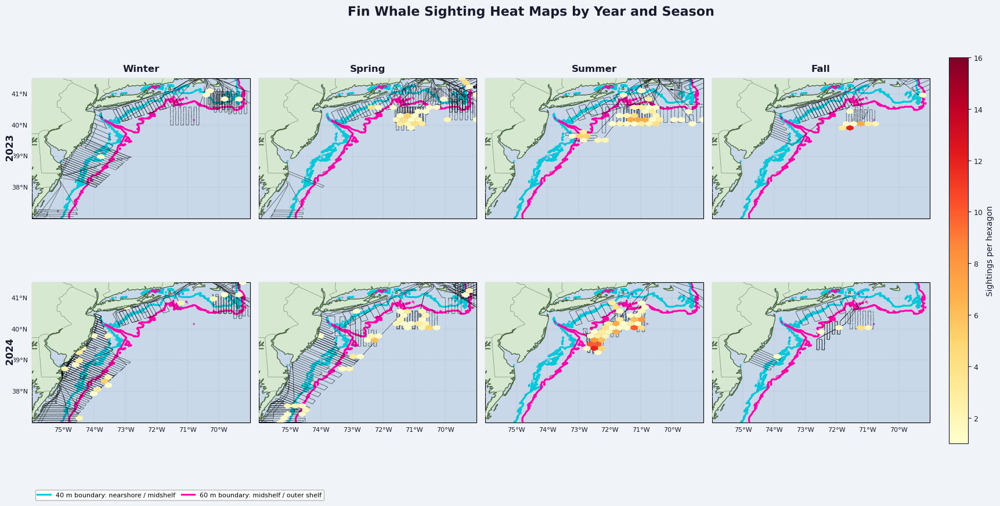

Humpback Whale: done.               


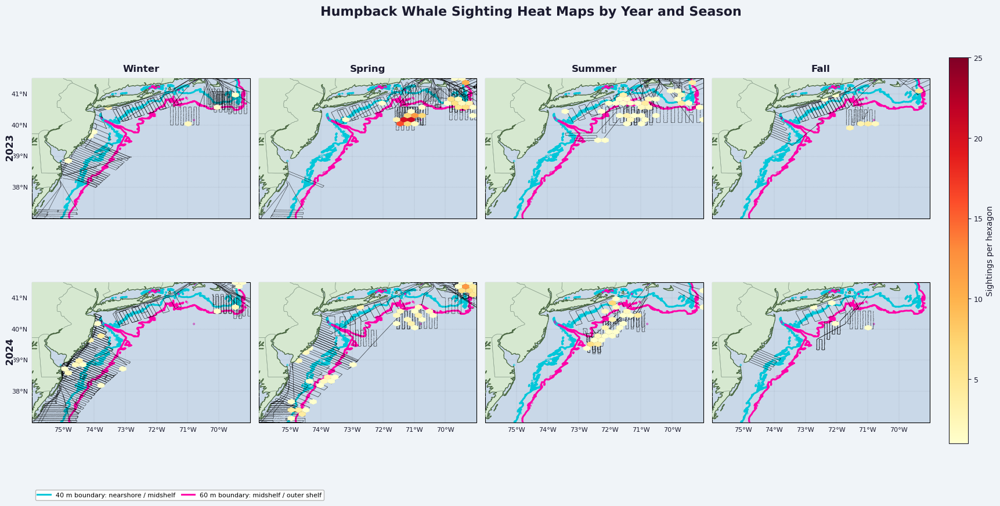

Right Whale: done.               


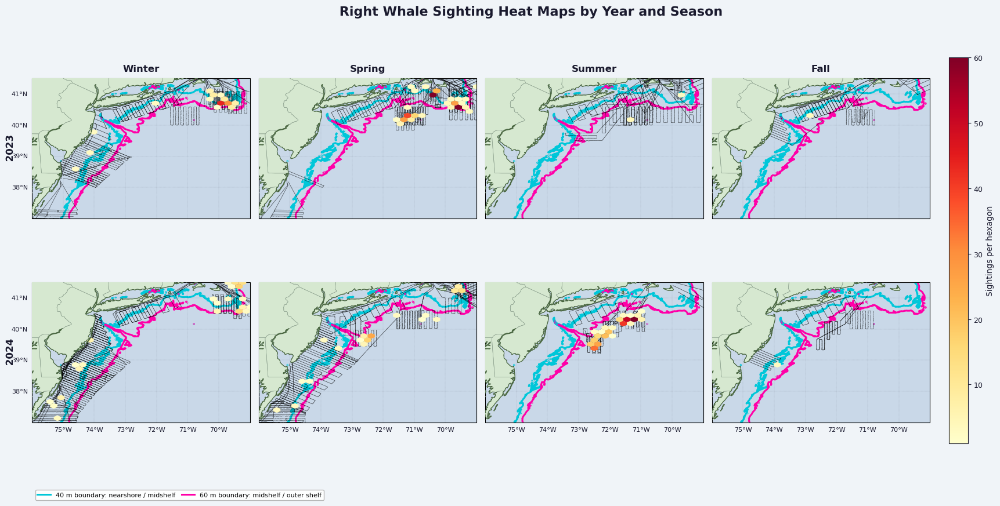

Minke Whale: done.               


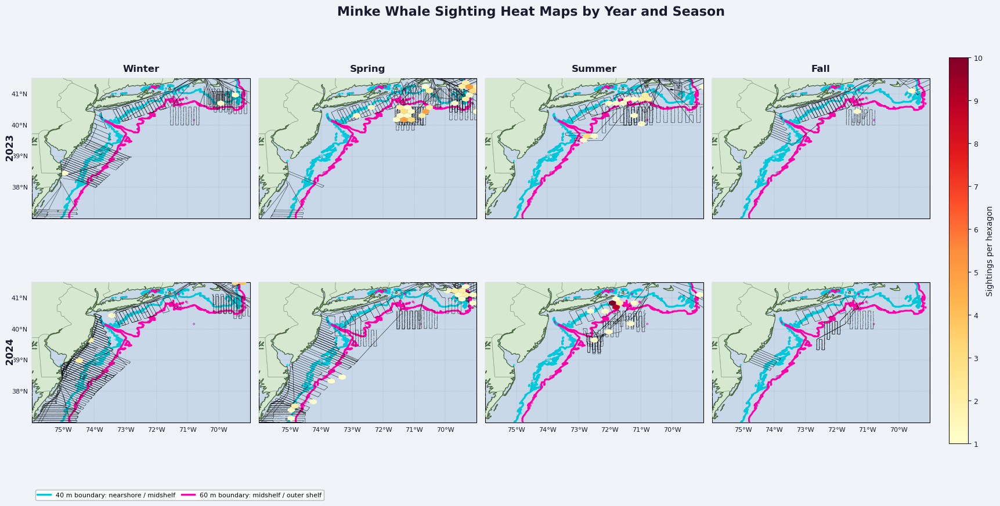

Sei Whale: done.               


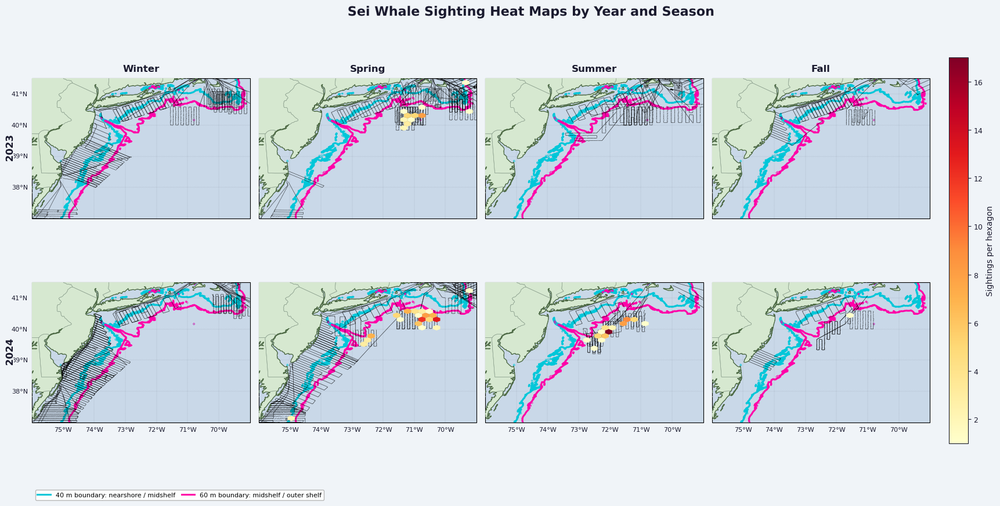

Blue Whale: done.               


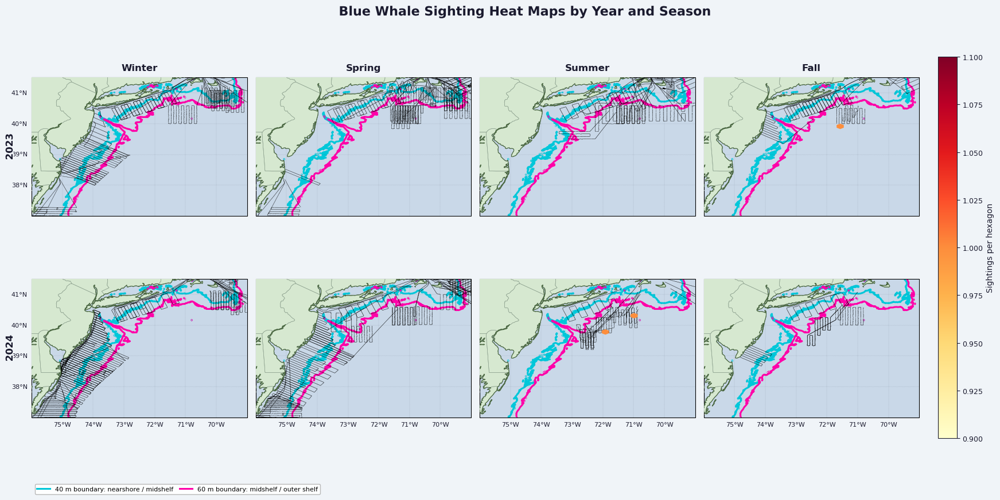

In [25]:
# ============================================================
# YEAR x SEASON HEATMAPS BY SPECIES WITH SHELF-STRATA BATHYMETRY
# ============================================================
# Output:
#   one 2 x 4 figure per species
#   rows    = year
#   columns = season
#
# This is the most readable way to show "year by season by species"
# without making one enormous figure.
# ============================================================

YSS_DIR = BASE_DIR / "year_by_season_by_species_heatmaps_with_bathy"
YSS_DIR.mkdir(parents=True, exist_ok=True)

# Include all whale species that you have been plotting.
all_species_order = ["FIWH", "HUWH", "RIWH", "MIWH", "SEWH", "BLWH"]

season_order  = ["W", "Sp", "Su", "F"]
season_labels = {"W": "Winter", "Sp": "Spring", "Su": "Summer", "F": "Fall"}

# Cache tracks by year + season so the plotting loop stays quick.
track_y_s_cache = {
    (yr, s): track_df[(track_df["year"] == yr) & (track_df["season"] == s)].copy()
    for yr in year_order
    for s in season_order
}

for sp in all_species_order:
    sp_name = species_map.get(sp, sp)

    # Use one color scale per species across all year-season panels.
    panel_data = {}
    panel_maxes = []

    for yr in year_order:
        for s in season_order:
            sub = sightings[
                (sightings["SPCODE"] == sp) &
                (sightings["year"] == yr) &
                (sightings["season"] == s)
            ].copy()

            panel_data[(yr, s)] = sub

            if not sub.empty:
                counts, *_ = np.histogram2d(
                    sub["LATITUDE"], sub["LONGITUDE"],
                    bins=GRID_SIZE,
                    range=[[LAT_MIN, LAT_MAX], [LON_MIN, LON_MAX]]
                )
                counts = counts[counts >= MIN_COUNT]
                if counts.size > 0:
                    panel_maxes.append(counts.max())

    vmax = max(panel_maxes) if panel_maxes else 1
    norm = Normalize(vmin=1, vmax=vmax)

    fig, axes = plt.subplots(
        nrows=len(year_order),
        ncols=len(season_order),
        figsize=(20, 9),
        subplot_kw={"projection": PROJ},
        facecolor=FIG_BG,
        squeeze=False
    )
    fig.subplots_adjust(left=0.07, right=0.88, bottom=0.14, top=0.88, wspace=0.04, hspace=0.12)

    hb_for_fig = None
    n_panels = len(year_order) * len(season_order)
    done = 0

    for i, yr in enumerate(year_order):
        for j, s in enumerate(season_order):
            ax = axes[i, j]

            setup_panel_map(
                ax,
                show_left_labels=(j == 0),
                show_bottom_labels=(i == len(year_order) - 1)
            )

            # Bathymetry goes under tracks and hexbins.
            add_shelf_strata_bathy(ax, bathy_study, label_boundaries=(i == 0 and j == 0), add_legend=(i == 0 and j == 0), zorder=0.6)

            # Add the matching on-effort survey tracks for this year-season panel.
            add_tracks(ax, track_y_s_cache[(yr, s)])

            sub = panel_data[(yr, s)]

            if not sub.empty:
                hb = ax.hexbin(
                    sub["LONGITUDE"],
                    sub["LATITUDE"],
                    gridsize=GRID_SIZE,
                    mincnt=MIN_COUNT,
                    cmap="YlOrRd",
                    extent=HEX_EXTENT,
                    norm=norm,
                    transform=PROJ,
                    linewidths=0.0,
                    edgecolors="none",
                    zorder=4,
                    rasterized=True
                )
                hb_for_fig = hb

            # Redraw land/coastline on top so hexbins and contours do not bleed onto shore.
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)

            if i == 0:
                ax.text(
                    0.5, 1.04, season_labels[s],
                    transform=ax.transAxes,
                    ha="center", va="bottom",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold"
                )

            if j == 0:
                ax.text(
                    -0.10, 0.5, str(yr),
                    transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold",
                    clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)]
                )

            done += 1
            print(f"{sp_name}: panel {done}/{n_panels}", end="\r", flush=True)

    print(f"{sp_name}: done.               ")

    fig.suptitle(
        f"{sp_name} Sighting Heat Maps by Year and Season",
        fontsize=16, color=TITLE_COLOR, fontweight="bold", y=0.98,
        path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
    )

    # One bathymetry legend for the whole figure, outside the map panels.
    add_figure_bathy_legend(fig, x=0.07, y=0.025)

    if hb_for_fig is not None:
        cbar = fig.colorbar(hb_for_fig, ax=axes[:, :], fraction=0.025, pad=0.02)
        cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
        cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
        plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
        cbar.outline.set_edgecolor(CBAR_COLOR)

    out_png = YSS_DIR / f"{sp}_year_by_season_heatmap_bathy.png"
    fig.savefig(out_png, dpi=250, bbox_inches="tight", facecolor=FIG_BG)
    # PNG is used instead of PDF here because vector PDFs with Cartopy coastlines + contours can trigger MemoryError.
    plt.show()

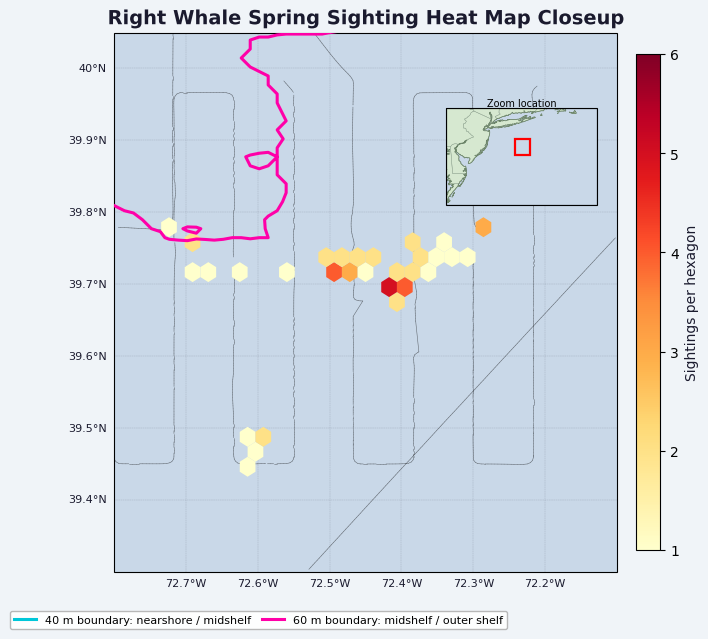

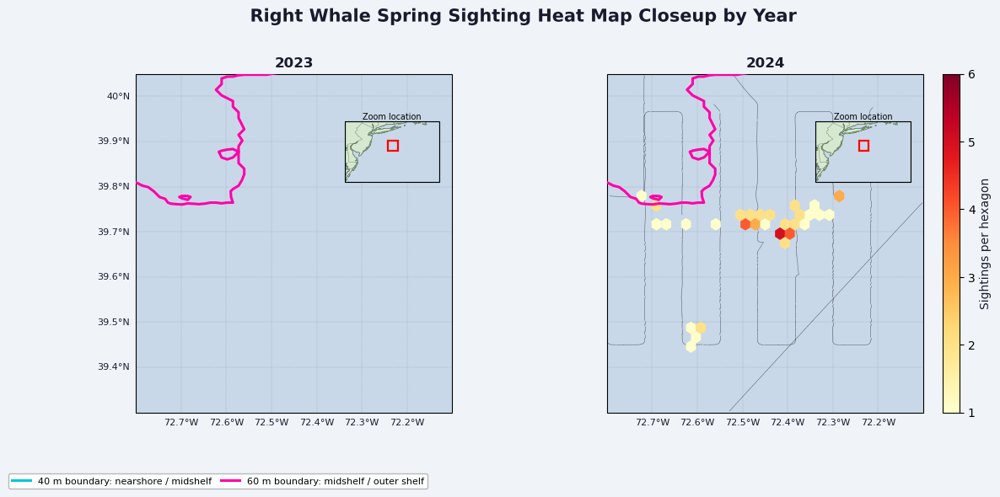

In [26]:
# ============================================================
# RIGHT WHALE SPRING CLOSEUP HEATMAP WITH SHELF-STRATA BATHYMETRY
# ============================================================

CLOSE_DIR = BASE_DIR / "right_whale_spring_closeup_with_bathy"
CLOSE_DIR.mkdir(parents=True, exist_ok=True)

CLOSE_LON_MIN = -72.80
CLOSE_LON_MAX = -72.10
CLOSE_LAT_MIN =  39.30
CLOSE_LAT_MAX =  40.05

CLOSE_EXTENT = [CLOSE_LON_MIN, CLOSE_LON_MAX, CLOSE_LAT_MIN, CLOSE_LAT_MAX]
CLOSE_HEX_EXT = (CLOSE_LON_MIN, CLOSE_LON_MAX, CLOSE_LAT_MIN, CLOSE_LAT_MAX)

bathy_close = load_bathy_for_extent(CLOSE_EXTENT, pad=0.15)

def setup_close_map(ax, show_left_labels=False, show_bottom_labels=False):
    ax.set_extent(CLOSE_EXTENT, crs=PROJ)
    ax.set_facecolor(OCEAN_COLOR)
    ax.add_feature(cfeature.OCEAN.with_scale("10m"), facecolor=OCEAN_COLOR, zorder=0)
    ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=LAND_COLOR, zorder=1)
    ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor=STATE_COLOR, linewidth=0.4, zorder=2)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=3)

    gl = ax.gridlines(draw_labels=True, linewidth=0.3, color=LABEL_COLOR, alpha=0.25, linestyle="--")
    gl.top_labels = False
    gl.right_labels = False
    gl.left_labels = show_left_labels
    gl.bottom_labels = show_bottom_labels
    gl.xlabel_style = {"size": 8, "color": LABEL_COLOR}
    gl.ylabel_style = {"size": 8, "color": LABEL_COLOR}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER


# Clip data to the closeup box
close_sightings = sightings[
    sightings["LONGITUDE"].between(CLOSE_LON_MIN, CLOSE_LON_MAX) &
    sightings["LATITUDE"].between(CLOSE_LAT_MIN, CLOSE_LAT_MAX)
].copy()

close_tracks = track_df[
    track_df["LONGITUDE"].between(CLOSE_LON_MIN, CLOSE_LON_MAX) &
    track_df["LATITUDE"].between(CLOSE_LAT_MIN, CLOSE_LAT_MAX)
].copy()

# Spring right whales only
riwh_spring = close_sightings[
    (close_sightings["SPCODE"] == "RIWH") &
    (close_sightings["season"] == "Sp")
].copy()

spring_tracks = close_tracks[close_tracks["season"] == "Sp"].copy()


# ============================================================
# 1) ALL-YEARS CLOSEUP MAP
# ============================================================

fig, ax = plt.subplots(
    figsize=(8, 7),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG
)

setup_close_map(ax, show_left_labels=True, show_bottom_labels=True)
add_shelf_strata_bathy(ax, bathy_close, label_boundaries=False, add_legend=False, zorder=8)
add_tracks(ax, spring_tracks)

# Calculate actual maximum hex count for this specific map
close_vmax = 1

if not riwh_spring.empty:
    counts, *_ = np.histogram2d(
        riwh_spring["LATITUDE"],
        riwh_spring["LONGITUDE"],
        bins=32,
        range=[[CLOSE_LAT_MIN, CLOSE_LAT_MAX], [CLOSE_LON_MIN, CLOSE_LON_MAX]]
    )

    valid_counts = counts[counts >= MIN_COUNT]
    close_vmax = int(valid_counts.max()) if valid_counts.size > 0 else 1

norm = Normalize(vmin=1, vmax=close_vmax)

hb = None
if not riwh_spring.empty:
    hb = ax.hexbin(
        riwh_spring["LONGITUDE"],
        riwh_spring["LATITUDE"],
        gridsize=32,
        mincnt=MIN_COUNT,
        cmap="YlOrRd",
        extent=CLOSE_HEX_EXT,
        norm=norm,
        transform=PROJ,
        linewidths=0.0,
        edgecolors="none",
        zorder=4,
        rasterized=True
    )

# Redraw land/coastline on top
ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=LAND_COLOR, zorder=5)
ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)

# Inset shows where this close-up sits inside the full study area.
add_locator_inset(ax, CLOSE_EXTENT)

ax.set_title(
    "Right Whale Spring Sighting Heat Map Closeup",
    fontsize=14,
    color=TITLE_COLOR,
    fontweight="bold",
    path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
)

add_figure_bathy_legend(fig, x=0.08, y=0.02)

if hb is not None:
    cbar = fig.colorbar(
        hb,
        ax=ax,
        fraction=0.04,
        pad=0.03,
        extend="neither"
    )

    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.set_ticks(np.arange(1, close_vmax + 1, 1))
    cbar.set_ticklabels([str(i) for i in range(1, close_vmax + 1)])

out_png = CLOSE_DIR / "RIWH_spring_closeup_heatmap_bathy_all_years.png"
fig.savefig(out_png, dpi=250, bbox_inches="tight", facecolor=FIG_BG)
plt.show()


# ============================================================
# 2) SAME CLOSEUP SPLIT BY YEAR
# ============================================================

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(year_order),
    figsize=(14, 6),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)

fig.subplots_adjust(left=0.06, right=0.88, bottom=0.18, top=0.85, wspace=0.05)

year_close_maxes = []
year_close_data = {}

for yr in year_order:
    sub = riwh_spring[riwh_spring["year"] == yr].copy()
    year_close_data[yr] = sub

    if not sub.empty:
        counts, *_ = np.histogram2d(
            sub["LATITUDE"],
            sub["LONGITUDE"],
            bins=32,
            range=[[CLOSE_LAT_MIN, CLOSE_LAT_MAX], [CLOSE_LON_MIN, CLOSE_LON_MAX]]
        )

        valid_counts = counts[counts >= MIN_COUNT]
        if valid_counts.size > 0:
            year_close_maxes.append(valid_counts.max())

year_vmax = int(max(year_close_maxes)) if year_close_maxes else 1
year_norm = Normalize(vmin=1, vmax=year_vmax)

hb_for_fig = None

for j, yr in enumerate(year_order):
    ax = axes[0, j]

    setup_close_map(ax, show_left_labels=(j == 0), show_bottom_labels=True)
    add_shelf_strata_bathy(ax, bathy_close, label_boundaries=False, add_legend=False, zorder=8)
    add_tracks(ax, spring_tracks[spring_tracks["year"] == yr].copy())

    sub = year_close_data[yr]

    if not sub.empty:
        hb_for_fig = ax.hexbin(
            sub["LONGITUDE"],
            sub["LATITUDE"],
            gridsize=32,
            mincnt=MIN_COUNT,
            cmap="YlOrRd",
            extent=CLOSE_HEX_EXT,
            norm=year_norm,
            transform=PROJ,
            linewidths=0.0,
            edgecolors="none",
            zorder=4,
            rasterized=True
        )

    ax.add_feature(cfeature.LAND.with_scale("10m"), facecolor=LAND_COLOR, zorder=5)
    ax.add_feature(cfeature.STATES.with_scale("10m"), edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)

    # Inset shows where this close-up sits inside the full study area.
    add_locator_inset(ax, CLOSE_EXTENT)

    ax.set_title(str(yr), fontsize=12, color=TITLE_COLOR, fontweight="bold")

fig.suptitle(
    "Right Whale Spring Sighting Heat Map Closeup by Year",
    fontsize=15,
    color=TITLE_COLOR,
    fontweight="bold",
    path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
)

add_figure_bathy_legend(fig, x=0.06, y=0.02)

if hb_for_fig is not None:
    cbar = fig.colorbar(
        hb_for_fig,
        ax=axes[:, :],
        fraction=0.03,
        pad=0.02,
        extend="neither"
    )

    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.set_ticks(np.arange(1, year_vmax + 1, 1))
    cbar.set_ticklabels([str(i) for i in range(1, year_vmax + 1)])

out_png = CLOSE_DIR / "RIWH_spring_closeup_heatmap_bathy_by_year.png"
fig.savefig(out_png, dpi=250, bbox_inches="tight", facecolor=FIG_BG)
plt.show()

Rendering panels: done.24... hexbin...   Rendering panels: 6/6


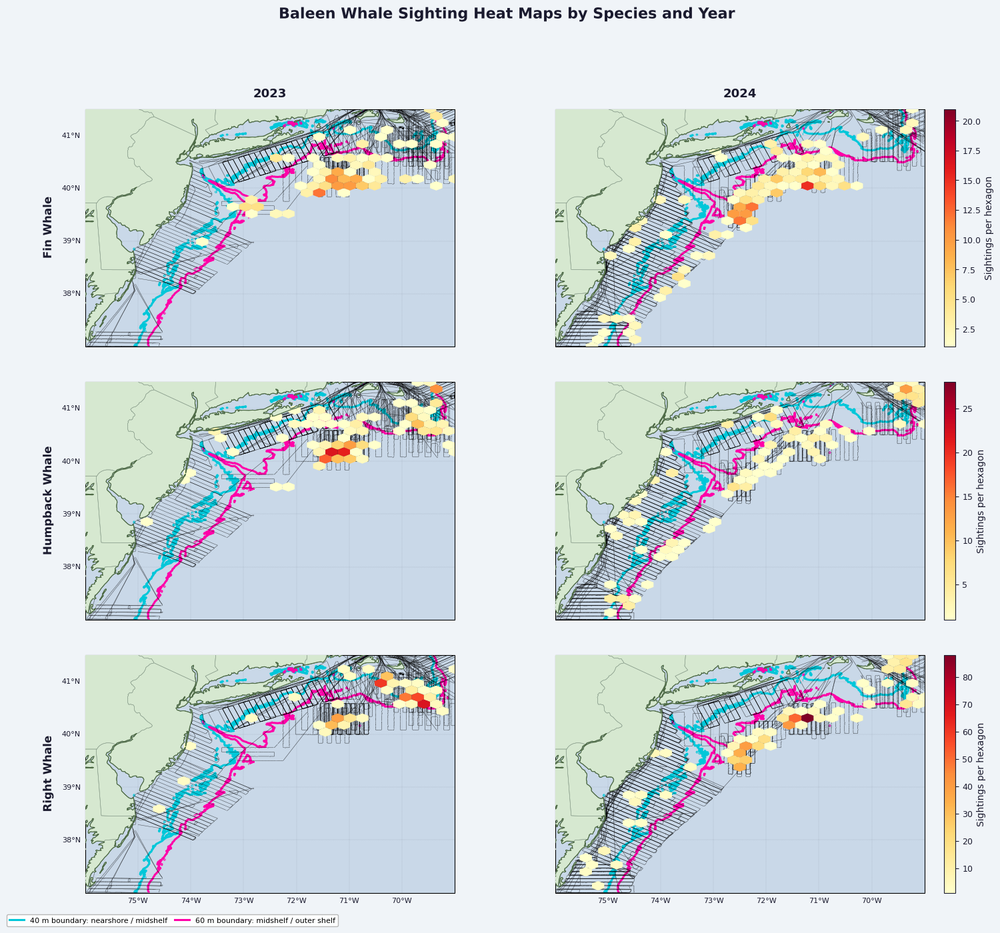

Saved: outputs\plot_outputs_heatmaps\main_text_heatmaps\main_text_common_species_sighting_heatmaps_with_tracks.png


In [27]:
fig, axes = plt.subplots(
    nrows=len(main_species_order),
    ncols=len(year_order),
    figsize=(18, 14),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)

fig.subplots_adjust(left=0.08, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

row_hbs = []

n_panels = len(main_species_order) * len(year_order)
_desc = "Rendering panels"
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  {_desc}: {_done[0]}/{n_panels}", end="\r", flush=True)

for i, sp in enumerate(main_species_order):
    sp_name = species_map.get(sp, sp)
    yearly_max  = []
    yearly_data = {}

    for yr in year_order:
        sub = sightings[(sightings["SPCODE"] == sp) & (sightings["year"] == yr)].copy()
        yearly_data[yr] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"],
                bins=GRID_SIZE,
                range=[[LAT_MIN, LAT_MAX], [LON_MIN, LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                yearly_max.append(counts.max())

    vmax = max(yearly_max) if yearly_max else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, yr in enumerate(year_order):
        ax = axes[i, j]
        setup_panel_map(ax, show_left_labels=(j == 0), show_bottom_labels=(i == len(main_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_study, zorder=3)

        print(f"  [{i*len(year_order)+j+1}/{n_panels}] Tracks: {sp} {yr}...", end=" ", flush=True)
        yr_tracks = track_df[track_df["year"] == yr].iloc[::2].copy()
        add_tracks(ax, yr_tracks)
        print("hexbin...", end=" ", flush=True)

        sub = yearly_data[yr]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=GRID_SIZE,
                mincnt=MIN_COUNT,
                cmap="YlOrRd",          # perceptually uniform, publication safe
                extent=HEX_EXTENT,
                norm=norm,
                transform=PROJ,
                linewidths=0.0,
                edgecolors="none",
                zorder=4
            )
            # Redraw land on top so hexbins don't bleed onto shore
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)
            if hb_for_row is None:
                hb_for_row = hb

        if i == 0:
            # Year label placed just above the top of each column panel
            ax.text(
                0.5, 1.04, str(yr),
                transform=ax.transAxes,
                ha="center", va="bottom",
                fontsize=13, color=TITLE_COLOR, fontweight="bold"
            )

        if j == 0:
            ax.text(
                -0.1, 0.5, sp_name,
                transform=ax.transAxes,
                rotation=90, va="center", ha="center",
                fontsize=12, color=TITLE_COLOR, fontweight="bold", clip_on=False,
                path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)]
            )

        _tick()

    row_hbs.append(hb_for_row)

print(f"{_desc}: done.")

fig.suptitle(
    "Baleen Whale Sighting Heat Maps by Species and Year",
    fontsize=16, color=TITLE_COLOR, fontweight="bold", y=1.01,
    path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
)

add_figure_bathy_legend(fig, x=0.08, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = MAIN_DIR / "main_text_common_species_sighting_heatmaps_with_tracks.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

  [12/12] RIWH F tracks... hexbin...   panel 12/122
All panels done — saving...


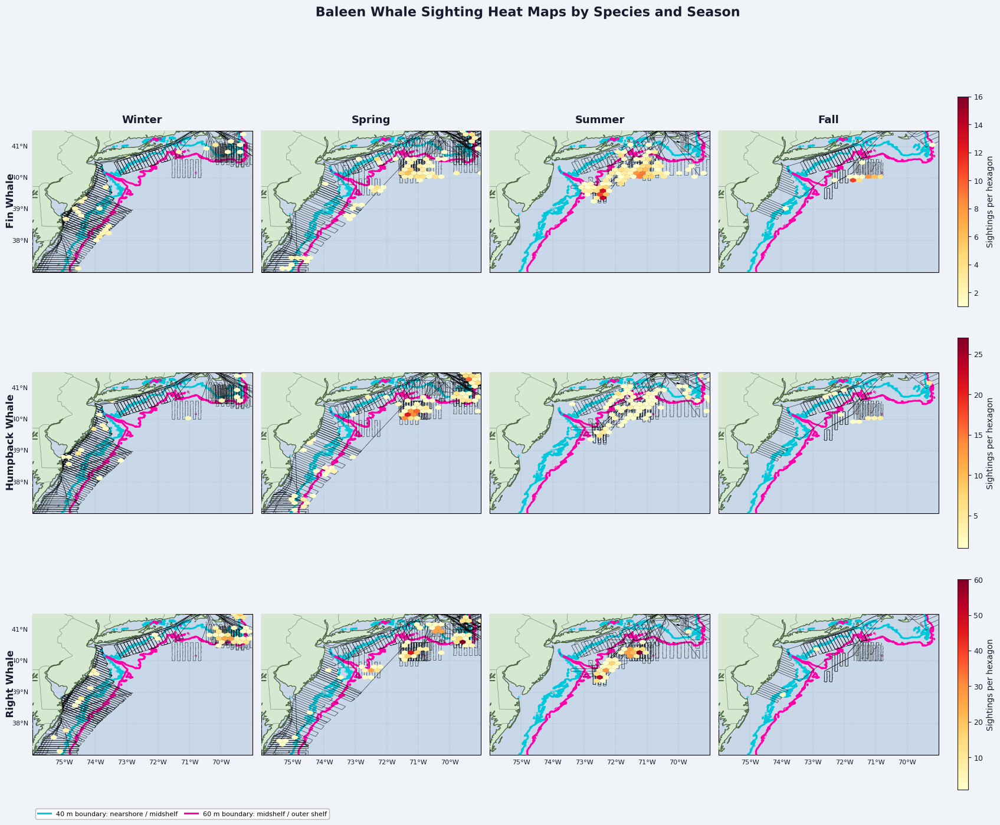

Saved: outputs\plot_outputs_heatmaps\seasonal_heatmaps_common_species\common_species_sighting_heatmaps_by_season.png


In [28]:
# ============================================================
# COMMON-SPECIES HEATMAPS BY SEASON
# ============================================================
from pathlib import Path

BASE_DIR   = Path("outputs/plot_outputs_heatmaps")
SEASON_DIR = BASE_DIR / "seasonal_heatmaps_common_species"
BASE_DIR.mkdir(parents=True, exist_ok=True)
SEASON_DIR.mkdir(parents=True, exist_ok=True)

season_order  = ["W", "Sp", "Su", "F"]
season_labels = {"W": "Winter", "Sp": "Spring", "Su": "Summer", "F": "Fall"}

# Pre-slice tracks once per season so add_tracks doesn't scan all years each panel
season_tracks_cache = {s: track_df[track_df["season"] == s].copy() for s in season_order}

fig, axes = plt.subplots(
    nrows=len(main_species_order),
    ncols=len(season_order),
    figsize=(20, 14),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)
fig.subplots_adjust(left=0.08, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

n_panels = len(main_species_order) * len(season_order)
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  panel {_done[0]}/{n_panels}", end="\r", flush=True)

row_hbs = []

for i, sp in enumerate(main_species_order):
    sp_name      = species_map.get(sp, sp)
    seasonal_max = []
    seasonal_data = {}

    for s in season_order:
        sub = sightings[(sightings["SPCODE"] == sp) & (sightings["season"] == s)].copy()
        seasonal_data[s] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"], bins=GRID_SIZE,
                range=[[LAT_MIN, LAT_MAX], [LON_MIN, LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                seasonal_max.append(counts.max())

    vmax = max(seasonal_max) if seasonal_max else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, s in enumerate(season_order):
        ax = axes[i, j]
        setup_panel_map(ax,
                        show_left_labels=(j == 0),
                        show_bottom_labels=(i == len(main_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_study, zorder=3)

        print(f"  [{i*len(season_order)+j+1}/{n_panels}] {sp} {s} tracks...", end=" ", flush=True)
        add_tracks(ax, season_tracks_cache[s])
        print("hexbin...", end=" ", flush=True)

        sub = seasonal_data[s]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=36, mincnt=MIN_COUNT, cmap="YlOrRd",
                extent=HEX_EXTENT, norm=norm, transform=PROJ,
                linewidths=0.0, edgecolors="none", zorder=4
            )
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)
            if hb_for_row is None:
                hb_for_row = hb

        if i == 0:
            ax.text(0.5, 1.04, season_labels[s], transform=ax.transAxes,
                    ha="center", va="bottom", fontsize=13,
                    color=TITLE_COLOR, fontweight="bold")
        if j == 0:
            ax.text(-0.1, 0.5, sp_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold", clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)])
        _tick()

    row_hbs.append(hb_for_row)

print("\nAll panels done — saving...")

fig.suptitle("Baleen Whale Sighting Heat Maps by Species and Season",
             fontsize=16, color=TITLE_COLOR, fontweight="bold", y=1.01,
             path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)])

add_figure_bathy_legend(fig, x=0.08, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = SEASON_DIR / "common_species_sighting_heatmaps_by_season.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

  [12/12] BLWH F tracks... hexbin...   panel 12/122
All panels done — saving...


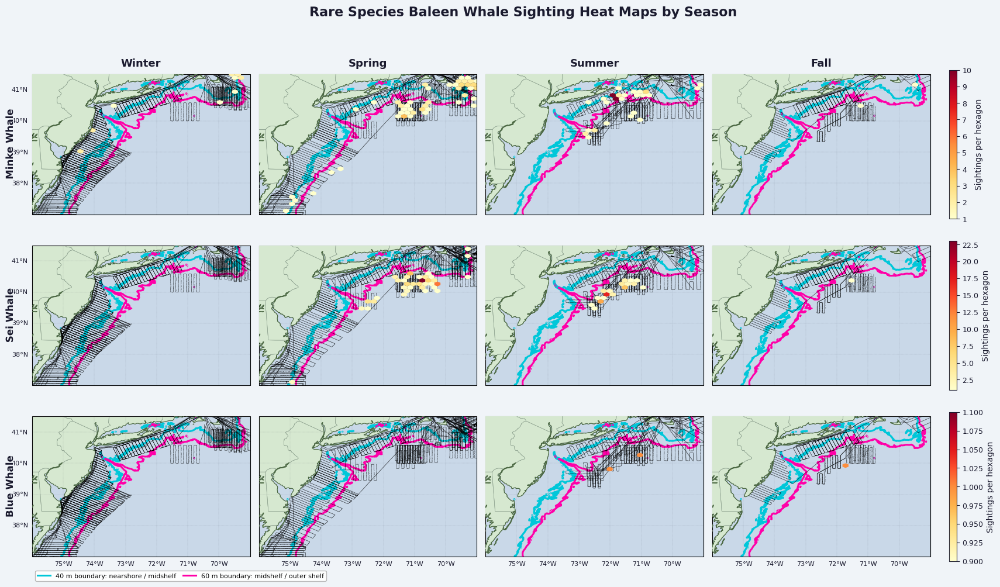

Saved: outputs\plot_outputs_heatmaps\seasonal_heatmaps_rare_species\rare_species_sighting_heatmaps_by_season.png


In [29]:
# ============================================================
# RARE-SPECIES HEATMAPS BY SEASON
# ============================================================
from pathlib import Path

BASE_DIR   = Path("outputs/plot_outputs_heatmaps")
SEASON_DIR = BASE_DIR / "seasonal_heatmaps_rare_species"
BASE_DIR.mkdir(parents=True, exist_ok=True)
SEASON_DIR.mkdir(parents=True, exist_ok=True)

rare_species_order = ["MIWH", "SEWH", "BLWH"]
season_order       = ["W", "Sp", "Su", "F"]
season_labels      = {"W": "Winter", "Sp": "Spring", "Su": "Summer", "F": "Fall"}

# Pre-slice tracks once per season
season_tracks_cache = {s: track_df[track_df["season"] == s].copy() for s in season_order}

fig, axes = plt.subplots(
    nrows=len(rare_species_order),
    ncols=len(season_order),
    figsize=(20, 10),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)
fig.subplots_adjust(left=0.08, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

n_panels = len(rare_species_order) * len(season_order)
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  panel {_done[0]}/{n_panels}", end="\r", flush=True)

row_hbs = []

for i, sp in enumerate(rare_species_order):
    sp_name      = species_map.get(sp, sp)
    seasonal_max = []
    seasonal_data = {}

    for s in season_order:
        sub = sightings[(sightings["SPCODE"] == sp) & (sightings["season"] == s)].copy()
        seasonal_data[s] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"], bins=GRID_SIZE,
                range=[[LAT_MIN, LAT_MAX], [LON_MIN, LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                seasonal_max.append(counts.max())

    vmax = max(seasonal_max) if seasonal_max else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, s in enumerate(season_order):
        ax = axes[i, j]
        setup_panel_map(ax,
                        show_left_labels=(j == 0),
                        show_bottom_labels=(i == len(rare_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_study, zorder=3)

        print(f"  [{i*len(season_order)+j+1}/{n_panels}] {sp} {s} tracks...", end=" ", flush=True)
        add_tracks(ax, season_tracks_cache[s])
        print("hexbin...", end=" ", flush=True)

        sub = seasonal_data[s]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=36, mincnt=MIN_COUNT, cmap="YlOrRd",
                extent=HEX_EXTENT, norm=norm, transform=PROJ,
                linewidths=0.0, edgecolors="none", zorder=4
            )
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)
            if hb_for_row is None:
                hb_for_row = hb

        if i == 0:
            ax.text(0.5, 1.04, season_labels[s], transform=ax.transAxes,
                    ha="center", va="bottom", fontsize=13,
                    color=TITLE_COLOR, fontweight="bold")
        if j == 0:
            ax.text(-0.1, 0.5, sp_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold", clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)])
        _tick()

    row_hbs.append(hb_for_row)

print("\nAll panels done — saving...")

fig.suptitle("Rare Species Baleen Whale Sighting Heat Maps by Season",
             fontsize=16, color=TITLE_COLOR, fontweight="bold", y=1.01,
             path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)])

add_figure_bathy_legend(fig, x=0.08, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = SEASON_DIR / "rare_species_sighting_heatmaps_by_season.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

  [6/6] BLWH 2024 tracks... hexbin...   panel 6/6
All panels done — saving...


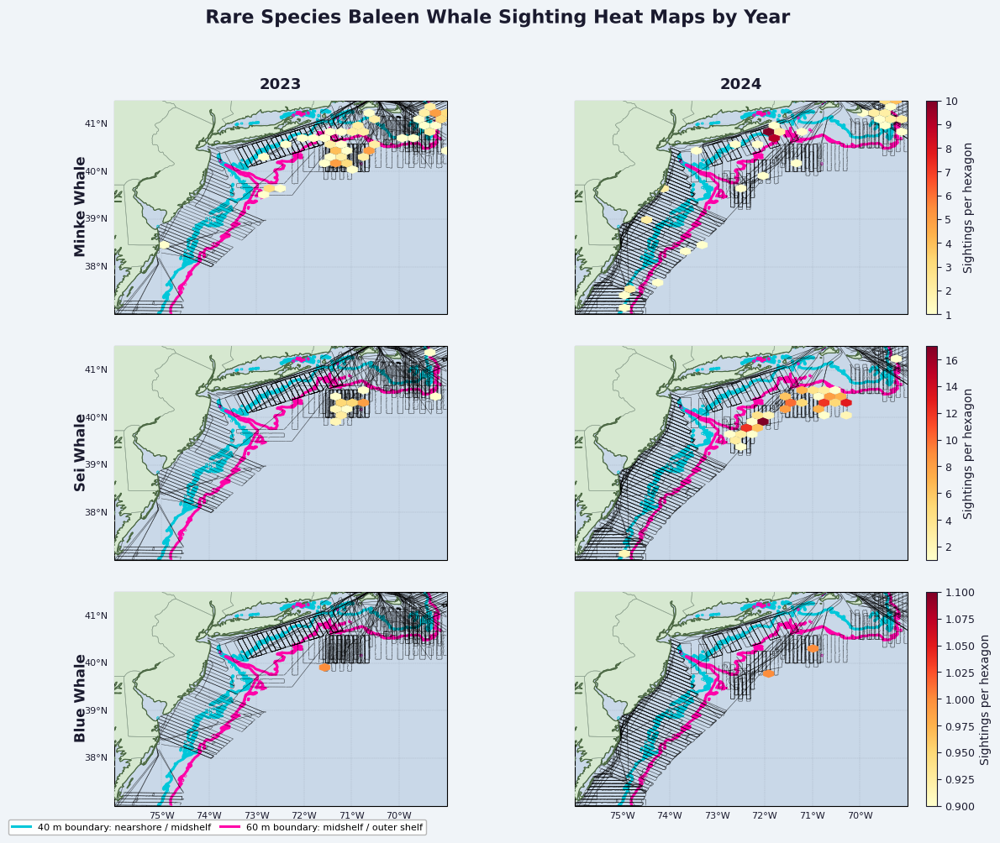

Saved: outputs\plot_outputs_heatmaps\yearly_heatmaps_rare_species\rare_species_sighting_heatmaps_by_year.png


In [30]:
# ============================================================
# RARE-SPECIES HEATMAPS BY YEAR
# ============================================================
from pathlib import Path

BASE_DIR = Path("outputs/plot_outputs_heatmaps")
RARE_DIR = BASE_DIR / "yearly_heatmaps_rare_species"
BASE_DIR.mkdir(parents=True, exist_ok=True)
RARE_DIR.mkdir(parents=True, exist_ok=True)

rare_species_order = ["MIWH", "SEWH", "BLWH"]

fig, axes = plt.subplots(
    nrows=len(rare_species_order),
    ncols=len(year_order),
    figsize=(14, 10),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)
fig.subplots_adjust(left=0.08, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

n_panels = len(rare_species_order) * len(year_order)
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  panel {_done[0]}/{n_panels}", end="\r", flush=True)

row_hbs = []

for i, sp in enumerate(rare_species_order):
    sp_name   = species_map.get(sp, sp)
    yr_maxes  = []
    yr_data   = {}

    for yr in year_order:
        sub = sightings[(sightings["SPCODE"] == sp) & (sightings["year"] == yr)].copy()
        yr_data[yr] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"], bins=GRID_SIZE,
                range=[[LAT_MIN, LAT_MAX], [LON_MIN, LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                yr_maxes.append(counts.max())

    vmax = max(yr_maxes) if yr_maxes else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, yr in enumerate(year_order):
        ax = axes[i, j]
        setup_panel_map(ax,
                        show_left_labels=(j == 0),
                        show_bottom_labels=(i == len(rare_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_study, zorder=3)

        print(f"  [{i*len(year_order)+j+1}/{n_panels}] {sp} {yr} tracks...", end=" ", flush=True)
        yr_tracks = track_df[track_df["year"] == yr].iloc[::2].copy()
        add_tracks(ax, yr_tracks)
        print("hexbin...", end=" ", flush=True)

        sub = yr_data[yr]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=GRID_SIZE, mincnt=MIN_COUNT, cmap="YlOrRd",
                extent=HEX_EXTENT, norm=norm, transform=PROJ,
                linewidths=0.0, edgecolors="none", zorder=4
            )
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)
            if hb_for_row is None:
                hb_for_row = hb

        if i == 0:
            ax.text(0.5, 1.04, str(yr), transform=ax.transAxes,
                    ha="center", va="bottom", fontsize=13,
                    color=TITLE_COLOR, fontweight="bold")
        if j == 0:
            ax.text(-0.1, 0.5, sp_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold", clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)])
        _tick()

    row_hbs.append(hb_for_row)

print("\nAll panels done — saving...")

fig.suptitle("Rare Species Baleen Whale Sighting Heat Maps by Year",
             fontsize=16, color=TITLE_COLOR, fontweight="bold", y=1.01,
             path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)])

add_figure_bathy_legend(fig, x=0.08, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = RARE_DIR / "rare_species_sighting_heatmaps_by_year.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

In [31]:
centroids = (
    sightings[sightings["SPCODE"].isin(main_species_order)]
    .groupby(["SPCODE", "year"], as_index=False)
    .agg(
        mean_lat=("LATITUDE", "mean"),
        mean_lon=("LONGITUDE", "mean"),
        n_sightings=("LATITUDE", "count")
    )
)

centroids["Species"] = centroids["SPCODE"].map(species_map)
print(centroids.sort_values(["Species", "year"]))

  SPCODE  year   mean_lat   mean_lon  n_sightings         Species
0   FIWH  2023  40.212092 -71.152380          176       Fin Whale
1   FIWH  2024  39.719909 -72.142839          247       Fin Whale
2   HUWH  2023  40.450151 -70.799258          227  Humpback Whale
3   HUWH  2024  40.006557 -71.804531          173  Humpback Whale
4   RIWH  2023  40.625948 -70.348654          455     Right Whale
5   RIWH  2024  40.094667 -71.595054          608     Right Whale


In [32]:
centroids = (
    sightings[sightings["SPCODE"].isin(main_species_order)]
    .groupby(["SPCODE", "season"], as_index=False)
    .agg(
        mean_lat=("LATITUDE", "mean"),
        mean_lon=("LONGITUDE", "mean"),
        n_sightings=("LATITUDE", "count")
    )
)

centroids["Species"] = centroids["SPCODE"].map(species_map)
print(centroids.sort_values(["Species", "season"]))

   SPCODE season   mean_lat   mean_lon  n_sightings         Species
0    FIWH      F  39.990501 -71.410765           40       Fin Whale
1    FIWH     Sp  39.955331 -71.508042          115       Fin Whale
2    FIWH     Su  40.003244 -71.670716          227       Fin Whale
3    FIWH      W  39.339660 -72.999809           41       Fin Whale
4    HUWH      F  40.403897 -71.003744           23  Humpback Whale
5    HUWH     Sp  40.244842 -70.982135          240  Humpback Whale
6    HUWH     Su  40.419804 -71.303941          102  Humpback Whale
7    HUWH      W  39.784198 -72.909001           35  Humpback Whale
8    RIWH      F  39.629453 -73.415605            6     Right Whale
9    RIWH     Sp  40.471399 -70.736307          424     Right Whale
10   RIWH     Su  40.016698 -71.784824          388     Right Whale
11   RIWH      W  40.564226 -70.421351          245     Right Whale


In [ ]:
# ============================================================
# HUDSON CANYON ZOOM — SIGHTING HEATMAPS BY YEAR
# ============================================================
# Hudson Canyon head: ~40.08°N, 73.97°W
# Zoom extent chosen to show the shelf break, canyon, and
# adjacent shelf/slope where whales concentrate.
# ============================================================
from matplotlib.collections import LineCollection

# Screenshot guide corners approximate:
#   upper-left  ~ 40.128°N, -72.976°W
#   upper-right ~ 39.907°N, -71.680°W
#   lower-left  ~ 39.178°N, -73.249°W
#   lower-right ~ 38.954°N, -71.986°W
# Use a rectangular plotting/filtering extent that captures that rotated box.
HC_LAT_MIN =  39.30
HC_LAT_MAX =  40.05
HC_LON_MIN = -72.10
HC_LON_MAX = -72.80
HC_EXTENT  = [HC_LON_MIN, HC_LON_MAX, HC_LAT_MIN, HC_LAT_MAX]
HC_HEX_EXT = (HC_LON_MIN, HC_LON_MAX, HC_LAT_MIN, HC_LAT_MAX)

HC_DIR = BASE_DIR / "hudson_canyon_heatmaps"
HC_DIR.mkdir(parents=True, exist_ok=True)

bathy_hc = load_bathy_for_extent(HC_EXTENT, pad=0.15)

def setup_hc_map(ax, show_left_labels=False, show_bottom_labels=False):
    ax.set_extent(HC_EXTENT, crs=PROJ)

    ax.set_facecolor(OCEAN_COLOR)
    ax.add_feature(cfeature.OCEAN.with_scale("10m"),     facecolor=OCEAN_COLOR, zorder=0)
    ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=1)
    ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=2)
    ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=3)
    gl = ax.gridlines(draw_labels=True, linewidth=0.3, color=LABEL_COLOR,
                      alpha=0.2, linestyle="--")
    gl.top_labels    = False
    gl.right_labels  = False
    gl.left_labels   = show_left_labels
    gl.bottom_labels = show_bottom_labels
    gl.xlabel_style  = {"size": 8, "color": LABEL_COLOR}
    gl.ylabel_style  = {"size": 8, "color": LABEL_COLOR}
    gl.xformatter    = LONGITUDE_FORMATTER
    gl.yformatter    = LATITUDE_FORMATTER

# Clip sightings and tracks to Hudson Canyon zoom box
hc_sightings = sightings[
    sightings["LATITUDE"].between(HC_LAT_MIN, HC_LAT_MAX) &
    sightings["LONGITUDE"].between(HC_LON_MIN, HC_LON_MAX)
].copy()
hc_sightings = hc_sightings[hc_sightings["year"].isin(ANALYSIS_YEARS)].copy()

hc_tracks = track_df[
    track_df["LATITUDE"].between(HC_LAT_MIN, HC_LAT_MAX) &
    track_df["LONGITUDE"].between(HC_LON_MIN, HC_LON_MAX)
].copy()
hc_tracks = hc_tracks[hc_tracks["year"].isin(ANALYSIS_YEARS)].copy()

fig, axes = plt.subplots(
    nrows=len(main_species_order),
    ncols=len(year_order),
    figsize=(14, 14),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)
fig.subplots_adjust(left=0.10, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

n_panels = len(main_species_order) * len(year_order)
_desc = "HC yearly panels"
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  {_desc}: {_done[0]}/{n_panels}", end="\r", flush=True)

row_hbs = []

for i, sp in enumerate(main_species_order):
    sp_name  = species_map.get(sp, sp)
    y_maxes  = []
    y_data   = {}

    for yr in year_order:
        sub = hc_sightings[(hc_sightings["SPCODE"] == sp) & (hc_sightings["year"] == yr)].copy()
        y_data[yr] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"], bins=40,
                range=[[HC_LAT_MIN, HC_LAT_MAX], [HC_LON_MIN, HC_LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                y_maxes.append(counts.max())

    vmax = max(y_maxes) if y_maxes else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, yr in enumerate(year_order):
        ax = axes[i, j]
        setup_hc_map(ax, show_left_labels=(j == 0),
                         show_bottom_labels=(i == len(main_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_hc, zorder=3)

        print(f"  [{i*len(year_order)+j+1}/{n_panels}] Tracks: {sp} {yr}...", end=" ", flush=True)
        yr_hc_tracks = hc_tracks[hc_tracks["year"] == yr].iloc[::2].copy()
        add_tracks(ax, yr_hc_tracks)
        print("hexbin...", end=" ", flush=True)

        sub = y_data[yr]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=40,
                mincnt=MIN_COUNT,
                cmap="YlOrRd",
                extent=HC_HEX_EXT,
                norm=norm,
                transform=PROJ,
                linewidths=0.0,
                edgecolors="none",
                zorder=4
            )
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)

            if hb_for_row is None:
                hb_for_row = hb

        # Inset shows where the Hudson Canyon zoom sits inside the full study area.
        # Kept outside the data check so every close-up panel has the same locator.
        add_locator_inset(ax, HC_EXTENT)

        if i == 0:
            ax.text(0.5, 1.04, str(yr), transform=ax.transAxes,
                    ha="center", va="bottom", fontsize=13,
                    color=TITLE_COLOR, fontweight="bold")

        if j == 0:
            ax.text(-0.12, 0.5, sp_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold",
                    clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)])
        _tick()

    row_hbs.append(hb_for_row)

print(f"{_desc}: done.")

# Canyon head marker
for ax_row in axes:
    for ax in ax_row:
        ax.plot(-73.97, 40.08, marker="v", markersize=6,
                color="#c0392b", transform=PROJ, zorder=8,
                label="Hudson Canyon head")

fig.suptitle(
    "Baleen Whale Sighting Heat Maps — Hudson Canyon Region by Year",
    fontsize=14, color=TITLE_COLOR, fontweight="bold", y=1.01,
    path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
)

add_figure_bathy_legend(fig, x=0.1, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = HC_DIR / "hudson_canyon_common_species_by_year.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

HC seasonal panels: done... hexbin...   HC seasonal panels: 12/122


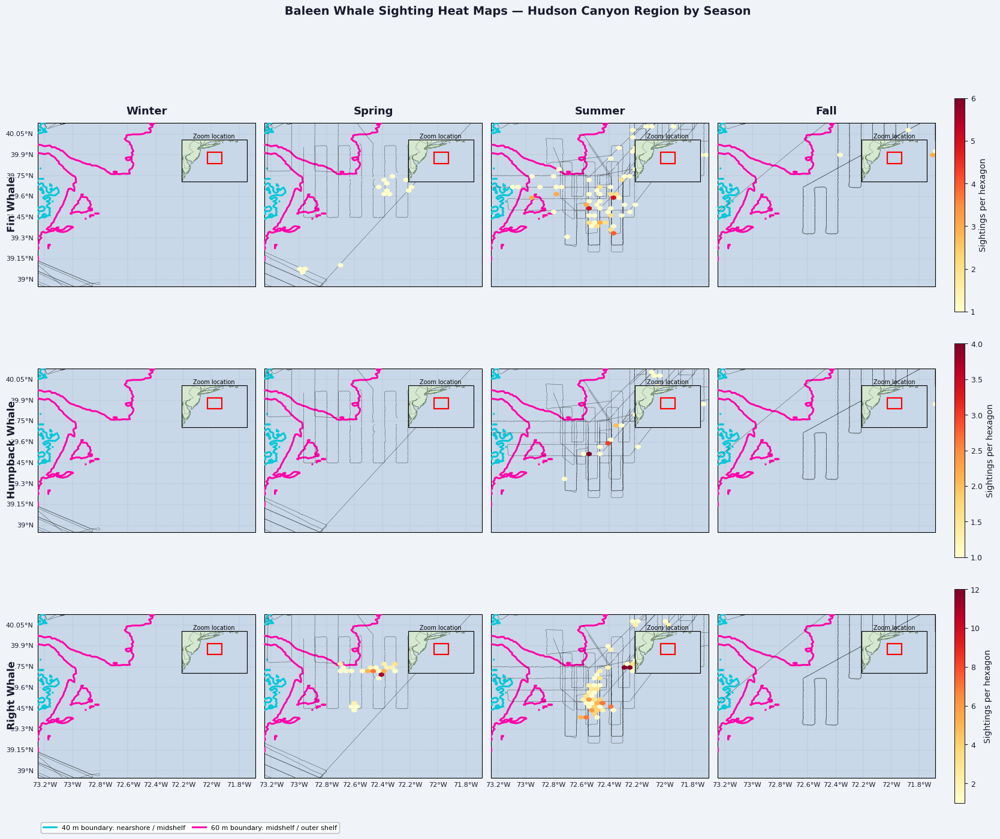

Saved: outputs\plot_outputs_heatmaps\hudson_canyon_heatmaps\hudson_canyon_common_species_by_season.png


In [34]:
# ============================================================
# HUDSON CANYON ZOOM — SIGHTING HEATMAPS BY SEASON
# ============================================================
fig, axes = plt.subplots(
    nrows=len(main_species_order),
    ncols=len(season_order),
    figsize=(20, 14),
    subplot_kw={"projection": PROJ},
    facecolor=FIG_BG,
    squeeze=False
)
fig.subplots_adjust(left=0.10, right=0.88, bottom=0.06, top=0.90, wspace=0.04, hspace=0.15)

n_panels = len(main_species_order) * len(season_order)
_desc = "HC seasonal panels"
_done = [0]
def _tick():
    _done[0] += 1
    print(f"  {_desc}: {_done[0]}/{n_panels}", end="\r", flush=True)

row_hbs = []

for i, sp in enumerate(main_species_order):
    sp_name    = species_map.get(sp, sp)
    s_maxes    = []
    s_data     = {}

    for season_code in season_order:
        sub = hc_sightings[
            (hc_sightings["SPCODE"] == sp) &
            (hc_sightings["season"] == season_code)
        ].copy()
        s_data[season_code] = sub
        if not sub.empty:
            counts, *_ = np.histogram2d(
                sub["LATITUDE"], sub["LONGITUDE"], bins=40,
                range=[[HC_LAT_MIN, HC_LAT_MAX], [HC_LON_MIN, HC_LON_MAX]]
            )
            counts = counts[counts >= MIN_COUNT]
            if counts.size > 0:
                s_maxes.append(counts.max())

    vmax = max(s_maxes) if s_maxes else 1
    norm = Normalize(vmin=1, vmax=vmax)
    hb_for_row = None

    for j, season_code in enumerate(season_order):
        ax = axes[i, j]
        setup_hc_map(ax, show_left_labels=(j == 0),
                         show_bottom_labels=(i == len(main_species_order) - 1))

        # Bathymetry contours: 40 m and 60 m are the actual shelf-strata boundaries.
        add_shelf_strata_bathy(ax, bathy_hc, zorder=3)

        print(f"  [{i*len(season_order)+j+1}/{n_panels}] Tracks: {sp} {season_code}...", end=" ", flush=True)
        s_tracks = hc_tracks[hc_tracks["season"] == season_code].copy()
        add_tracks(ax, s_tracks)
        print("hexbin...", end=" ", flush=True)

        sub = s_data[season_code]
        if not sub.empty:
            hb = ax.hexbin(
                sub["LONGITUDE"], sub["LATITUDE"],
                gridsize=40,
                mincnt=MIN_COUNT,
                cmap="YlOrRd",
                extent=HC_HEX_EXT,
                norm=norm,
                transform=PROJ,
                linewidths=0.0,
                edgecolors="none",
                zorder=4
            )
            ax.add_feature(cfeature.LAND.with_scale("10m"),      facecolor=LAND_COLOR,  zorder=5)
            ax.add_feature(cfeature.STATES.with_scale("10m"),    edgecolor=STATE_COLOR, linewidth=0.4, zorder=6)
            ax.add_feature(cfeature.COASTLINE.with_scale("10m"), edgecolor=COAST_COLOR, linewidth=0.8, zorder=7)

            if hb_for_row is None:
                hb_for_row = hb

        # Inset shows where the Hudson Canyon zoom sits inside the full study area.
        # Kept outside the data check so every close-up panel has the same locator.
        add_locator_inset(ax, HC_EXTENT)

        if i == 0:
            ax.text(0.5, 1.04, season_labels[season_code],
                    transform=ax.transAxes, ha="center", va="bottom",
                    fontsize=13, color=TITLE_COLOR, fontweight="bold")

        if j == 0:
            ax.text(-0.12, 0.5, sp_name, transform=ax.transAxes,
                    rotation=90, va="center", ha="center",
                    fontsize=12, color=TITLE_COLOR, fontweight="bold",
                    clip_on=False,
                    path_effects=[pe.withStroke(linewidth=2.5, foreground=FIG_BG)])
        _tick()

    row_hbs.append(hb_for_row)

print(f"{_desc}: done.")

# Canyon head marker on every panel
for ax_row in axes:
    for ax in ax_row:
        ax.plot(-73.97, 40.08, marker="v", markersize=6,
                color="#c0392b", transform=PROJ, zorder=8)

fig.suptitle(
    "Baleen Whale Sighting Heat Maps — Hudson Canyon Region by Season",
    fontsize=14, color=TITLE_COLOR, fontweight="bold", y=1.01,
    path_effects=[pe.withStroke(linewidth=3, foreground=FIG_BG)]
)

add_figure_bathy_legend(fig, x=0.1, y=0.02)

for i, hb_row in enumerate(row_hbs):
    if hb_row is None:
        continue
    cbar = fig.colorbar(hb_row, ax=axes[i, :], fraction=0.02, pad=0.02)
    cbar.set_label("Sightings per hexagon", color=CBAR_COLOR, fontsize=10)
    cbar.ax.yaxis.set_tick_params(color=CBAR_COLOR, labelsize=9)
    plt.setp(cbar.ax.get_yticklabels(), color=CBAR_COLOR)
    cbar.outline.set_edgecolor(CBAR_COLOR)
    for spine in cbar.ax.spines.values():
        spine.set_edgecolor(CBAR_COLOR)

outfile = HC_DIR / "hudson_canyon_common_species_by_season.png"
plt.savefig(outfile, dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()
print("Saved:", outfile)

In [36]:
# ============================================================
# SPATIAL STRATA CALCULATIONS USING GEBCO BATHYMETRY
# ============================================================
# This cell creates spue_by_stratum_daily for the depth-binned
# SPUE summary tables and boxplots below.
#
# Uses existing imports/constants/functions already loaded earlier.
# ============================================================

SPATIAL_OUT = Path("outputs/spatial_strata")
SPATIAL_OUT.mkdir(parents=True, exist_ok=True)

STRATUM_ORDER = ["Nearshore (<40 m)", "Midshelf (40-60 m)", "Outer shelf (>60 m)"]

def add_bathy_depth(df, bathy_ds, lon_col="LONGITUDE", lat_col="LATITUDE", depth_col="bottom_depth_m"):
    out = df.copy()

    lons = xr.DataArray(out[lon_col].to_numpy(), dims="points")
    lats = xr.DataArray(out[lat_col].to_numpy(), dims="points")

    out[depth_col] = bathy_ds["depth_m"].sel(
        lon=lons,
        lat=lats,
        method="nearest"
    ).to_numpy()

    return out


def assign_shelf_stratum(depth_series):
    return pd.cut(
        depth_series,
        bins=[0, 40, 60, np.inf],
        labels=STRATUM_ORDER,
        include_lowest=True,
        right=False
    )


# ------------------------------------------------------------
# 1. Assign sightings to GEBCO depth strata
# ------------------------------------------------------------
sightings_strata = sightings.copy()

if "Day" not in sightings_strata.columns:
    if "date" in sightings_strata.columns:
        sightings_strata["Day"] = pd.to_datetime(sightings_strata["date"]).dt.floor("D")
    elif "datetime" in sightings_strata.columns:
        sightings_strata["Day"] = pd.to_datetime(sightings_strata["datetime"]).dt.floor("D")
    elif "Date" in sightings_strata.columns:
        sightings_strata["Day"] = pd.to_datetime(sightings_strata["Date"]).dt.floor("D")

sightings_strata["year"] = pd.to_datetime(sightings_strata["Day"]).dt.year

if "season" not in sightings_strata.columns:
    sightings_strata["season"] = pd.to_datetime(sightings_strata["Day"]).dt.month.map({
        12: "W", 1: "W", 2: "W",
        3: "Sp", 4: "Sp", 5: "Sp",
        6: "Su", 7: "Su", 8: "Su",
        9: "F", 10: "F", 11: "F"
    })

sightings_strata = add_bathy_depth(
    sightings_strata,
    bathy_ds=bathy_study,
    lon_col="LONGITUDE",
    lat_col="LATITUDE",
    depth_col="bottom_depth_m"
)

sightings_strata["stratum"] = assign_shelf_stratum(sightings_strata["bottom_depth_m"])
sightings_strata = sightings_strata.dropna(subset=["Day", "year", "season", "stratum"]).copy()
sightings_strata = sightings_strata[sightings_strata["year"].isin(ANALYSIS_YEARS)].copy()


# ------------------------------------------------------------
# 2. Build survey-effort track segments and assign strata
# ------------------------------------------------------------
track_work = track_df.copy()

if "Day" not in track_work.columns:
    if "date" in track_work.columns:
        track_work["Day"] = pd.to_datetime(track_work["date"]).dt.floor("D")
    elif "datetime" in track_work.columns:
        track_work["Day"] = pd.to_datetime(track_work["datetime"]).dt.floor("D")
    elif "Date" in track_work.columns:
        track_work["Day"] = pd.to_datetime(track_work["Date"]).dt.floor("D")

if "datetime" not in track_work.columns:
    if "Date" in track_work.columns:
        track_work["datetime"] = pd.to_datetime(track_work["Date"], errors="coerce")

if "year" not in track_work.columns:
    track_work["year"] = pd.to_datetime(track_work["Day"]).dt.year

if "season" not in track_work.columns:
    track_work["season"] = pd.to_datetime(track_work["Day"]).dt.month.map({
        12: "W", 1: "W", 2: "W",
        3: "Sp", 4: "Sp", 5: "Sp",
        6: "Su", 7: "Su", 8: "Su",
        9: "F", 10: "F", 11: "F"
    })

track_work = track_work[track_work["year"].isin(ANALYSIS_YEARS)].copy()

group_cols = ["Day"]
for col in ["PLANE", "LEGTYPE", "LEGSTAGE"]:
    if col in track_work.columns:
        group_cols.append(col)

track_work = track_work.dropna(subset=["LONGITUDE", "LATITUDE", "datetime", "Day"]).copy()
track_work = track_work.sort_values(group_cols + ["datetime"]).copy()

segment_frames = []

for _, g in track_work.groupby(group_cols, sort=True):
    g = g.sort_values("datetime").copy()

    g["lon_next"] = g["LONGITUDE"].shift(-1)
    g["lat_next"] = g["LATITUDE"].shift(-1)
    g["time_next"] = g["datetime"].shift(-1)

    g = g.dropna(subset=["lon_next", "lat_next", "time_next"]).copy()

    g["time_gap_min"] = (g["time_next"] - g["datetime"]).dt.total_seconds() / 60

    g["segment_km"] = g.apply(
        lambda row: haversine_km(
            row["LONGITUDE"], row["LATITUDE"],
            row["lon_next"], row["lat_next"]
        ),
        axis=1
    )

    g = g[(g["time_gap_min"] <= 15) & (g["segment_km"] <= 20)].copy()

    if g.empty:
        continue

    g["mid_lon"] = (g["LONGITUDE"] + g["lon_next"]) / 2
    g["mid_lat"] = (g["LATITUDE"] + g["lat_next"]) / 2

    segment_frames.append(
        g[["Day", "year", "season", "mid_lon", "mid_lat", "segment_km"]].copy()
    )

track_segments = pd.concat(segment_frames, ignore_index=True)

track_segments = add_bathy_depth(
    track_segments,
    bathy_ds=bathy_study,
    lon_col="mid_lon",
    lat_col="mid_lat",
    depth_col="bottom_depth_m"
)

track_segments["stratum"] = assign_shelf_stratum(track_segments["bottom_depth_m"])
track_segments = track_segments.dropna(subset=["stratum"]).copy()


# ------------------------------------------------------------
# 3. Daily effort by stratum
# ------------------------------------------------------------
effort_by_day_stratum = (
    track_segments
    .groupby(["Day", "year", "season", "stratum"], as_index=False, observed=True)
    .agg(effort_km=("segment_km", "sum"))
)


# ------------------------------------------------------------
# 4. Daily sightings by species and stratum
# ------------------------------------------------------------
daily_sightings_stratum = (
    sightings_strata
    .groupby(["Day", "year", "season", "SPCODE", "stratum"], as_index=False, observed=True)
    .size()
    .rename(columns={"size": "n_sightings"})
)

daily_sightings_total_stratum = (
    sightings_strata
    .groupby(["Day", "year", "season", "stratum"], as_index=False, observed=True)
    .size()
    .rename(columns={"size": "n_sightings"})
)

daily_sightings_total_stratum["SPCODE"] = "TOTAL"

daily_sightings_stratum = pd.concat(
    [daily_sightings_stratum, daily_sightings_total_stratum],
    ignore_index=True
)


# ------------------------------------------------------------
# 5. Daily SPUE by stratum
# ------------------------------------------------------------
spue_by_stratum_daily = (
    daily_sightings_stratum
    .merge(
        effort_by_day_stratum,
        on=["Day", "year", "season", "stratum"],
        how="left"
    )
)

spue_by_stratum_daily = spue_by_stratum_daily[
    spue_by_stratum_daily["effort_km"].notna() &
    (spue_by_stratum_daily["effort_km"] > 0)
].copy()

spue_by_stratum_daily["spue"] = (
    spue_by_stratum_daily["n_sightings"] /
    spue_by_stratum_daily["effort_km"]
)

print("Created spue_by_stratum_daily")
print(spue_by_stratum_daily.head())

Created spue_by_stratum_daily
         Day  year season SPCODE             stratum  n_sightings   effort_km  \
0 2023-01-08  2023      W   FIWH   Nearshore (<40 m)            1  363.985408   
1 2023-01-08  2023      W   RIWH   Nearshore (<40 m)            9  363.985408   
2 2023-01-11  2023      W   RIWH   Nearshore (<40 m)            2  401.352809   
3 2023-01-11  2023      W   RIWH  Midshelf (40-60 m)            7  174.108066   
4 2023-01-19  2023      W   FIWH   Nearshore (<40 m)            1  393.615922   

       spue  
0  0.002747  
1  0.024726  
2  0.004983  
3  0.040205  
4  0.002541  


In [45]:
# ============================================================
# DEPTH-BINNED SPUE SUMMARY TABLES
# ============================================================
#
# Outputs:
#   1. depth_binned_spue_by_year_mean_sd_se.csv
#   2. depth_binned_spue_by_season_mean_sd_se.csv
#   3. depth_binned_spue_by_year_season_mean_sd_se.csv
#
# Each table reports mean daily SPUE ± SD and mean daily SPUE ± SE.

spue_table_input = spue_by_stratum_daily[
    spue_by_stratum_daily["year"].isin(ANALYSIS_YEARS)
].copy()

spue_table_input = spue_table_input[
    spue_table_input["SPCODE"].isin(BALEEN_CODES + ["TOTAL"])
].copy()

def summarize_spue_table(df, group_cols):
    out = (
        df.groupby(group_cols, observed=True)
        .agg(
            n_days=("spue", "count"),
            mean_spue=("spue", "mean"),
            sd_spue=("spue", "std")
        )
        .reset_index()
    )

    out["se_spue"] = out["sd_spue"] / np.sqrt(out["n_days"])
    out["mean_sd"] = out.apply(
        lambda r: (
            f"{r['mean_spue']:.6f} ± {r['sd_spue']:.6f}"
            if pd.notna(r["sd_spue"])
            else f"{r['mean_spue']:.6f} ± NA"
        ),
        axis=1
    )
    out["mean_se"] = out.apply(
        lambda r: (
            f"{r['mean_spue']:.6f} ± {r['se_spue']:.6f}"
            if pd.notna(r["se_spue"])
            else f"{r['mean_spue']:.6f} ± NA"
        ),
        axis=1
    )

    return out.sort_values(group_cols).reset_index(drop=True)

depth_spue_by_year = summarize_spue_table(
    spue_table_input,
    ["SPCODE", "year", "stratum"]
)

depth_spue_by_season = summarize_spue_table(
    spue_table_input,
    ["SPCODE", "season", "stratum"]
)

depth_spue_by_year_season = summarize_spue_table(
    spue_table_input,
    ["SPCODE", "year", "season", "stratum"]
)

depth_spue_by_year.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_year_mean_sd_se.csv",
    index=False
)

depth_spue_by_season.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_season_mean_sd_se.csv",
    index=False
)

depth_spue_by_year_season.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_year_season_mean_sd_se.csv",
    index=False
)

print("Saved depth-binned SPUE summary tables:")
print(SPATIAL_OUT / "depth_binned_spue_by_year_mean_sd_se.csv")
print(SPATIAL_OUT / "depth_binned_spue_by_season_mean_sd_se.csv")
print(SPATIAL_OUT / "depth_binned_spue_by_year_season_mean_sd_se.csv")

display(depth_spue_by_year.head(20))
display(depth_spue_by_season.head(20))

Saved depth-binned SPUE summary tables:
outputs\spatial_strata\depth_binned_spue_by_year_mean_sd_se.csv
outputs\spatial_strata\depth_binned_spue_by_season_mean_sd_se.csv
outputs\spatial_strata\depth_binned_spue_by_year_season_mean_sd_se.csv


,SPCODE,year,stratum,n_days,mean_spue,sd_spue,se_spue,mean_sd,mean_se
0,BLWH,2023,Outer shelf (>60 m),1,0.001301,NaN,NaN,0.001301 ± NA,0.001301 ± NA
1,BLWH,2024,Outer shelf (>60 m),2,0.002526,0.000800,0.000566,0.002526 ± 0.000800,0.002526 ± 0.000566
2,FIWH,2023,Nearshore (<40 m),8,0.015832,0.031320,0.011073,0.015832 ± 0.031320,0.015832 ± 0.011073
3,FIWH,2023,Midshelf (40-60 m),9,0.022441,0.027333,0.009111,0.022441 ± 0.027333,0.022441 ± 0.009111
4,FIWH,2023,Outer shelf (>60 m),21,0.014199,0.010673,0.002329,0.014199 ± 0.010673,0.014199 ± 0.002329
5,FIWH,2024,Nearshore (<40 m),15,0.003294,0.001739,0.000449,0.003294 ± 0.001739,0.003294 ± 0.000449
6,FIWH,2024,Midshelf (40-60 m),5,0.022363,0.016050,0.007178,0.022363 ± 0.016050,0.022363 ± 0.007178
7,FIWH,2024,Outer shelf (>60 m),27,0.024496,0.024399,0.004696,0.024496 ± 0.024399,0.024496 ± 0.004696
8,HUWH,2023,Nearshore (<40 m),14,0.008287,0.008562,0.002288,0.008287 ± 0.008562,0.008287 ± 0.002288
9,HUWH,2023,Midshelf (40-60 m),14,0.025724,0.030301,0.008098,0.025724 ± 0.030301,0.025724 ± 0.008098


,SPCODE,season,stratum,n_days,mean_spue,sd_spue,se_spue,mean_sd,mean_se
0,BLWH,F,Outer shelf (>60 m),1,0.001301,NaN,NaN,0.001301 ± NA,0.001301 ± NA
1,BLWH,Su,Outer shelf (>60 m),2,0.002526,0.000800,0.000566,0.002526 ± 0.000800,0.002526 ± 0.000566
2,FIWH,F,Nearshore (<40 m),1,0.002021,NaN,NaN,0.002021 ± NA,0.002021 ± NA
3,FIWH,F,Midshelf (40-60 m),1,0.022252,NaN,NaN,0.022252 ± NA,0.022252 ± NA
4,FIWH,F,Outer shelf (>60 m),4,0.013050,0.016674,0.008337,0.013050 ± 0.016674,0.013050 ± 0.008337
5,FIWH,Sp,Nearshore (<40 m),7,0.017234,0.033565,0.012686,0.017234 ± 0.033565,0.017234 ± 0.012686
6,FIWH,Sp,Midshelf (40-60 m),6,0.029979,0.030579,0.012484,0.029979 ± 0.030579,0.029979 ± 0.012484
7,FIWH,Sp,Outer shelf (>60 m),20,0.014446,0.011866,0.002653,0.014446 ± 0.011866,0.014446 ± 0.002653
8,FIWH,Su,Nearshore (<40 m),2,0.004868,0.002865,0.002026,0.004868 ± 0.002865,0.004868 ± 0.002026
9,FIWH,Su,Midshelf (40-60 m),5,0.020592,0.018153,0.008118,0.020592 ± 0.018153,0.020592 ± 0.008118


In [38]:
# ============================================================
# DEPTH-BINNED SPUE SUMMARY TABLES — MAIN THREE SPECIES ONLY
# ============================================================
# Requested follow-up table including only:
#   RIWH = North Atlantic right whale
#   FIWH = fin whale
#   HUWH = humpback whale
#
# Outputs:
#   1. depth_binned_spue_by_year_MAIN3_mean_sd_se.csv
#   2. depth_binned_spue_by_season_MAIN3_mean_sd_se.csv
#   3. depth_binned_spue_by_year_season_MAIN3_mean_sd_se.csv

main_three_species = ["RIWH", "FIWH", "HUWH"]

spue_table_main3 = spue_by_stratum_daily[
    spue_by_stratum_daily["year"].isin(ANALYSIS_YEARS) &
    spue_by_stratum_daily["SPCODE"].isin(main_three_species)
].copy()

# Reuse summarize_spue_table() from the previous cell.
depth_spue_by_year_main3 = summarize_spue_table(
    spue_table_main3,
    ["SPCODE", "year", "stratum"]
)

depth_spue_by_season_main3 = summarize_spue_table(
    spue_table_main3,
    ["SPCODE", "season", "stratum"]
)

depth_spue_by_year_season_main3 = summarize_spue_table(
    spue_table_main3,
    ["SPCODE", "year", "season", "stratum"]
)

# Add common names to make the files easier to read/share.
for _tbl in [depth_spue_by_year_main3, depth_spue_by_season_main3, depth_spue_by_year_season_main3]:
    _tbl.insert(1, "species_name", _tbl["SPCODE"].map(species_map).fillna(_tbl["SPCODE"]))

depth_spue_by_year_main3.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_year_MAIN3_mean_sd_se.csv",
    index=False
)

depth_spue_by_season_main3.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_season_MAIN3_mean_sd_se.csv",
    index=False
)

depth_spue_by_year_season_main3.to_csv(
    SPATIAL_OUT / "depth_binned_spue_by_year_season_MAIN3_mean_sd_se.csv",
    index=False
)

print("Saved main-three depth-binned SPUE summary tables:")
print(SPATIAL_OUT / "depth_binned_spue_by_year_MAIN3_mean_sd_se.csv")
print(SPATIAL_OUT / "depth_binned_spue_by_season_MAIN3_mean_sd_se.csv")
print(SPATIAL_OUT / "depth_binned_spue_by_year_season_MAIN3_mean_sd_se.csv")

display(depth_spue_by_year_main3)
display(depth_spue_by_season_main3)

Saved main-three depth-binned SPUE summary tables:
outputs\spatial_strata\depth_binned_spue_by_year_MAIN3_mean_sd_se.csv
outputs\spatial_strata\depth_binned_spue_by_season_MAIN3_mean_sd_se.csv
outputs\spatial_strata\depth_binned_spue_by_year_season_MAIN3_mean_sd_se.csv


,SPCODE,species_name,year,stratum,n_days,mean_spue,sd_spue,se_spue,mean_sd,mean_se
0,FIWH,Fin Whale,2023,Nearshore (<40 m),8,0.015832,0.031320,0.011073,0.015832 ± 0.031320,0.015832 ± 0.011073
1,FIWH,Fin Whale,2023,Midshelf (40-60 m),9,0.022441,0.027333,0.009111,0.022441 ± 0.027333,0.022441 ± 0.009111
2,FIWH,Fin Whale,2023,Outer shelf (>60 m),21,0.014199,0.010673,0.002329,0.014199 ± 0.010673,0.014199 ± 0.002329
3,FIWH,Fin Whale,2024,Nearshore (<40 m),15,0.003294,0.001739,0.000449,0.003294 ± 0.001739,0.003294 ± 0.000449
4,FIWH,Fin Whale,2024,Midshelf (40-60 m),5,0.022363,0.016050,0.007178,0.022363 ± 0.016050,0.022363 ± 0.007178
5,FIWH,Fin Whale,2024,Outer shelf (>60 m),27,0.024496,0.024399,0.004696,0.024496 ± 0.024399,0.024496 ± 0.004696
6,HUWH,Humpback Whale,2023,Nearshore (<40 m),14,0.008287,0.008562,0.002288,0.008287 ± 0.008562,0.008287 ± 0.002288
7,HUWH,Humpback Whale,2023,Midshelf (40-60 m),14,0.025724,0.030301,0.008098,0.025724 ± 0.030301,0.025724 ± 0.008098
8,HUWH,Humpback Whale,2023,Outer shelf (>60 m),17,0.023547,0.029856,0.007241,0.023547 ± 0.029856,0.023547 ± 0.007241
9,HUWH,Humpback Whale,2024,Nearshore (<40 m),16,0.005053,0.002668,0.000667,0.005053 ± 0.002668,0.005053 ± 0.000667


,SPCODE,species_name,season,stratum,n_days,mean_spue,sd_spue,se_spue,mean_sd,mean_se
0,FIWH,Fin Whale,F,Nearshore (<40 m),1,0.002021,NaN,NaN,0.002021 ± NA,0.002021 ± NA
1,FIWH,Fin Whale,F,Midshelf (40-60 m),1,0.022252,NaN,NaN,0.022252 ± NA,0.022252 ± NA
2,FIWH,Fin Whale,F,Outer shelf (>60 m),4,0.013050,0.016674,0.008337,0.013050 ± 0.016674,0.013050 ± 0.008337
3,FIWH,Fin Whale,Sp,Nearshore (<40 m),7,0.017234,0.033565,0.012686,0.017234 ± 0.033565,0.017234 ± 0.012686
4,FIWH,Fin Whale,Sp,Midshelf (40-60 m),6,0.029979,0.030579,0.012484,0.029979 ± 0.030579,0.029979 ± 0.012484
5,FIWH,Fin Whale,Sp,Outer shelf (>60 m),20,0.014446,0.011866,0.002653,0.014446 ± 0.011866,0.014446 ± 0.002653
6,FIWH,Fin Whale,Su,Nearshore (<40 m),2,0.004868,0.002865,0.002026,0.004868 ± 0.002865,0.004868 ± 0.002026
7,FIWH,Fin Whale,Su,Midshelf (40-60 m),5,0.020592,0.018153,0.008118,0.020592 ± 0.018153,0.020592 ± 0.008118
8,FIWH,Fin Whale,Su,Outer shelf (>60 m),18,0.022939,0.013728,0.003236,0.022939 ± 0.013728,0.022939 ± 0.003236
9,FIWH,Fin Whale,W,Nearshore (<40 m),13,0.003359,0.001629,0.000452,0.003359 ± 0.001629,0.003359 ± 0.000452


In [39]:
# ============================================================
# GROUPED BOXPLOT HELPERS FOR DEPTH-BINNED SPUE
# ============================================================
# Includes multiple outlier-handling options:
#   1) focused linear axis with standard 1.5*IQR fliers
#   2) log-transformed axis using log10(SPUE + epsilon)
#   3) capped outlier plot using 1.5*IQR upper fence
#
# Legends are figure-level, not inside each subplot.
# ============================================================

from matplotlib.patches import Patch

def _boxplot_figure_legend(fig, hue_order, colors, hue_col):
    handles = [
        Patch(facecolor=colors[j % len(colors)], edgecolor="black", alpha=0.68, label=str(hval))
        for j, hval in enumerate(hue_order)
    ]
    fig.legend(
        handles=handles,
        title=hue_col,
        loc="lower center",
        bbox_to_anchor=(0.5, 0.015),
        ncol=len(hue_order),
        fontsize=9,
        title_fontsize=9,
        frameon=True,
        framealpha=0.90,
        facecolor="white",
        edgecolor="0.75",
        borderpad=0.35,
        labelspacing=0.25,
        handlelength=1.5
    )


def grouped_boxplot(
    df,
    panel_species,
    x_col,
    hue_col,
    value_col="spue",
    x_order=None,
    hue_order=None,
    species_map=None,
    figsize=(16, 12),
    sharey=False,
    outfile=None,
    yscale="linear",
    linthresh=0.001,
    showfliers=True,
    title=None,
    method="focused_linear",
    ylim_quantile=0.98,
    epsilon=1e-5
):
    """
    Grouped boxplots with three methods:

    method="focused_linear":
        Standard boxplot with 1.5*IQR fliers shown as stars.
        Y-axis is focused using percentile/whisker logic and starts at 0.

    method="log_transform":
        Plots log10(SPUE + epsilon). This handles zeros while spreading
        out low SPUE values.

    method="capped":
        Caps values above the 1.5*IQR upper fence for plotting and marks
        true maxima in the panel text.
    """

    plot_df = df.copy()

    if x_order is None:
        x_order = list(plot_df[x_col].dropna().unique())
    if hue_order is None:
        hue_order = list(plot_df[hue_col].dropna().unique())

    n_species = len(panel_species)
    ncols = 2
    nrows = int(np.ceil(n_species / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, sharey=sharey)
    axes = np.atleast_1d(axes).flatten()

    colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]

    for ax, sp in zip(axes, panel_species):
        sub = plot_df[plot_df["SPCODE"] == sp].copy()

        if sub.empty:
            ax.set_visible(False)
            continue

        raw_all = sub[value_col].replace([np.inf, -np.inf], np.nan).dropna()
        raw_all = raw_all[np.isfinite(raw_all)]
        raw_all = raw_all[raw_all >= 0]
        true_max = raw_all.max() if len(raw_all) else np.nan

        if method == "capped" and len(raw_all[raw_all > 0]) > 0:
            pos = raw_all[raw_all > 0]
            q1 = pos.quantile(0.25)
            q3 = pos.quantile(0.75)
            iqr = q3 - q1
            global_cap = q3 + 1.5 * iqr
            if global_cap <= 0 or not np.isfinite(global_cap):
                global_cap = pos.quantile(0.98)
        else:
            global_cap = None

        data = []
        positions = []
        box_colors = []

        gap = 1.25
        width = 0.72
        pos_counter = 1
        centers = []

        for xval in x_order:
            start_pos = pos_counter

            for j, hval in enumerate(hue_order):
                vals = sub.loc[
                    (sub[x_col] == xval) & (sub[hue_col] == hval),
                    value_col
                ].replace([np.inf, -np.inf], np.nan).dropna().values

                vals = vals[np.isfinite(vals)]
                vals = vals[vals >= 0]

                if method == "log_transform":
                    vals = np.log10(vals + epsilon)
                elif method == "capped" and global_cap is not None:
                    vals = np.minimum(vals, global_cap)

                if len(vals) == 0:
                    vals = np.array([np.nan])

                data.append(vals)
                positions.append(pos_counter)
                box_colors.append(colors[j % len(colors)])
                pos_counter += 1

            end_pos = pos_counter - 1
            centers.append((start_pos + end_pos) / 2)
            pos_counter += gap

        flierprops = dict(
            marker="*",
            markersize=5,
            markerfacecolor="none",
            markeredgecolor="black",
            alpha=0.65
        )

        bp = ax.boxplot(
            data,
            positions=positions,
            widths=width,
            patch_artist=True,
            showfliers=showfliers,
            whis=1.5,
            flierprops=flierprops
        )

        for patch, color in zip(bp["boxes"], box_colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.68)
            patch.set_edgecolor("black")
            patch.set_linewidth(0.9)

        for median in bp["medians"]:
            median.set_color("black")
            median.set_linewidth(1.2)

        ax.set_xticks(centers)
        ax.set_xticklabels(x_order, rotation=15, ha="right")
        ax.set_title(species_map.get(sp, sp) if species_map else sp)
        ax.grid(axis="y", alpha=0.25)

        if method == "log_transform":
            ax.set_ylabel(f"log10(SPUE + {epsilon:g})")
            finite = np.concatenate([d[np.isfinite(d)] for d in data if len(d)])
            if len(finite):
                ax.set_ylim(np.nanmin(finite) - 0.15, np.nanmax(finite) * 1.05)
            ax.text(
                0.02, 0.94,
                f"true max = {true_max:.3g}",
                transform=ax.transAxes,
                va="top",
                ha="left",
                fontsize=8,
                bbox=dict(facecolor="white", edgecolor="none", alpha=0.72)
            )

        else:
            ax.set_ylabel("Sightings per km surveyed")

            if len(raw_all) > 0:
                positive_vals = raw_all[raw_all > 0]

                if method == "focused_linear" and len(positive_vals) > 0:
                    q1 = positive_vals.quantile(0.25)
                    q3 = positive_vals.quantile(0.75)
                    iqr = q3 - q1
                    upper_whisker = q3 + 1.5 * iqr
                    y_top = max(
                        positive_vals.quantile(ylim_quantile) * 1.15,
                        upper_whisker * 1.10,
                        positive_vals.min() * 4
                    )
                    if y_top >= true_max:
                        y_top = true_max * 1.05
                elif method == "capped" and global_cap is not None:
                    y_top = global_cap * 1.20
                else:
                    y_top = true_max * 1.05 if true_max > 0 else 1

                ax.set_ylim(0, y_top)

                label = f"true max = {true_max:.3g}"
                if method == "capped" and global_cap is not None:
                    label += f"\ncap = {global_cap:.3g}"

                ax.text(
                    0.02, 0.94,
                    label,
                    transform=ax.transAxes,
                    va="top",
                    ha="left",
                    fontsize=8,
                    bbox=dict(facecolor="white", edgecolor="none", alpha=0.72)
                )
            else:
                ax.set_ylim(0, 1)

    for ax in axes[len(panel_species):]:
        ax.set_visible(False)

    if title is None:
        title = f"{value_col.upper()} by {x_col} and {hue_col}"

    fig.suptitle(title, y=0.985, fontsize=14)
    _boxplot_figure_legend(fig, hue_order, colors, hue_col)
    fig.tight_layout(rect=[0, 0.07, 1, 0.96])

    if outfile is not None:
        fig.savefig(outfile, dpi=300, bbox_inches="tight")

    plt.show()

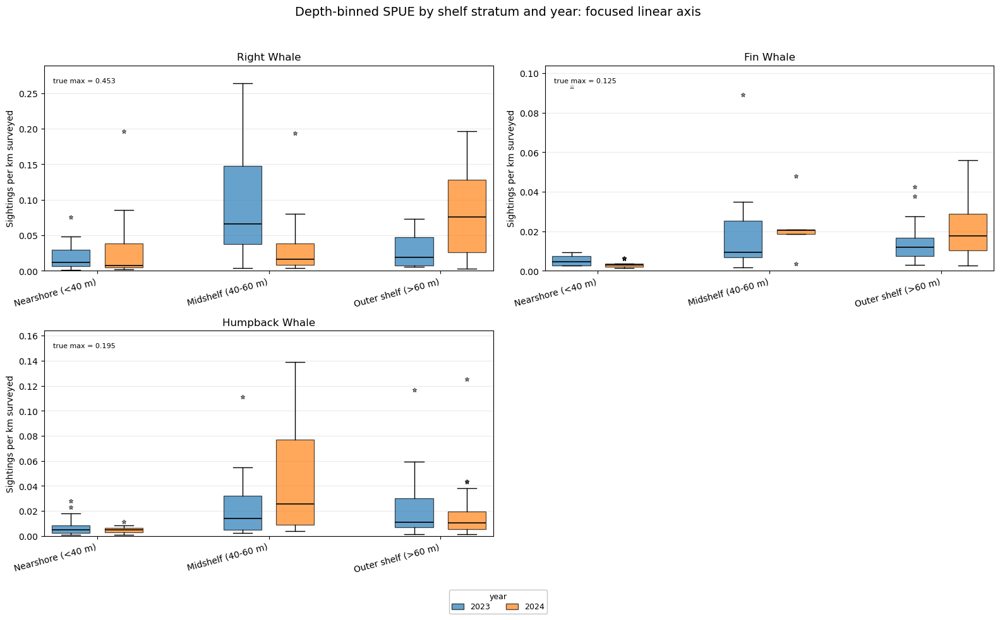

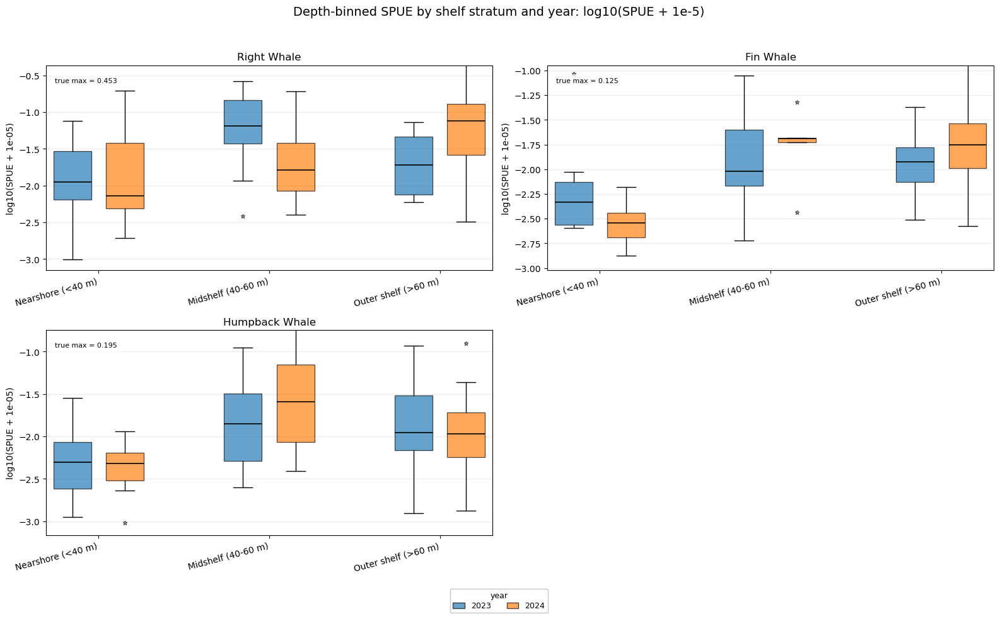

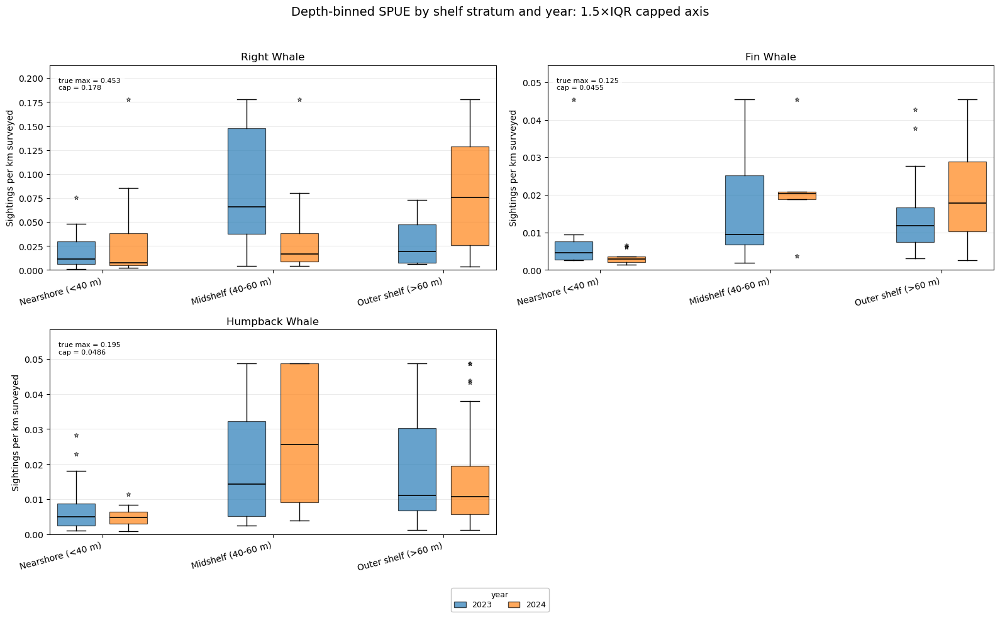

In [40]:
# ============================================================
# SPUE BOXPLOTS BY DEPTH STRATUM AND YEAR
# ============================================================
main_species_for_strata = ["RIWH", "FIWH", "HUWH"]

stratum_order = ["Nearshore (<40 m)", "Midshelf (40-60 m)", "Outer shelf (>60 m)"]
year_order = ANALYSIS_YEARS

# 1) Focused linear: standard 1.5*IQR outliers as stars, axis focused.
grouped_boxplot(
    df=spue_by_stratum_daily[spue_by_stratum_daily["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="year",
    value_col="spue",
    x_order=stratum_order,
    hue_order=year_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="focused_linear",
    ylim_quantile=0.98,
    title="Depth-binned SPUE by shelf stratum and year: focused linear axis",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_year_main_species_FOCUSED_LINEAR.png"
)

# 2) Log transform: log10(SPUE + epsilon), handles zeros without symlog.
grouped_boxplot(
    df=spue_by_stratum_daily[spue_by_stratum_daily["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="year",
    value_col="spue",
    x_order=stratum_order,
    hue_order=year_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="log_transform",
    epsilon=1e-5,
    title="Depth-binned SPUE by shelf stratum and year: log10(SPUE + 1e-5)",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_year_main_species_LOG_TRANSFORM.png"
)

# 3) Capped: values above the 1.5*IQR upper fence are capped for plotting.
grouped_boxplot(
    df=spue_by_stratum_daily[spue_by_stratum_daily["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="year",
    value_col="spue",
    x_order=stratum_order,
    hue_order=year_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="capped",
    title="Depth-binned SPUE by shelf stratum and year: 1.5×IQR capped axis",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_year_main_species_CAPPED.png"
)

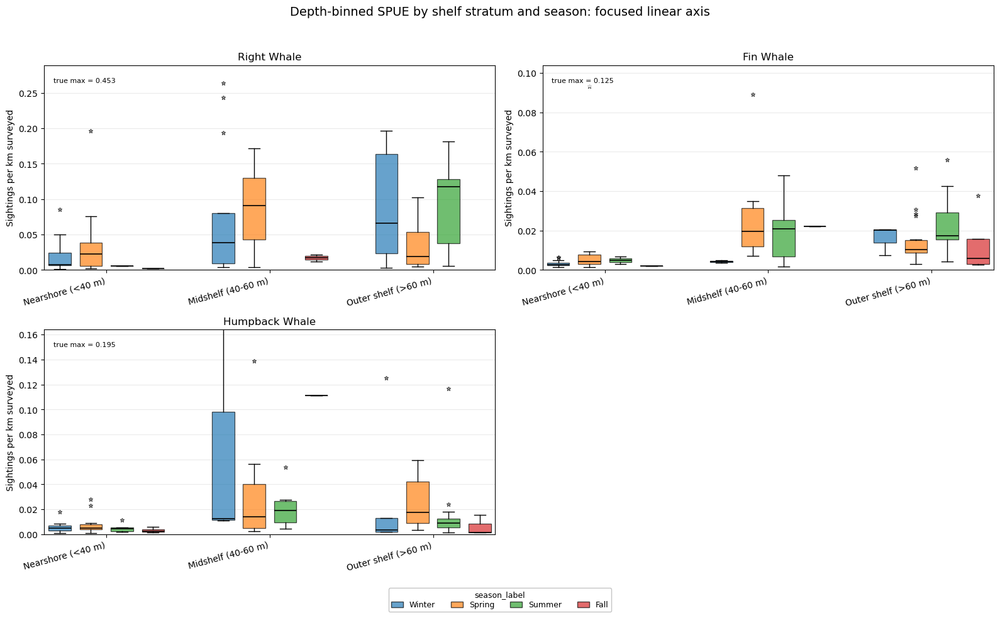

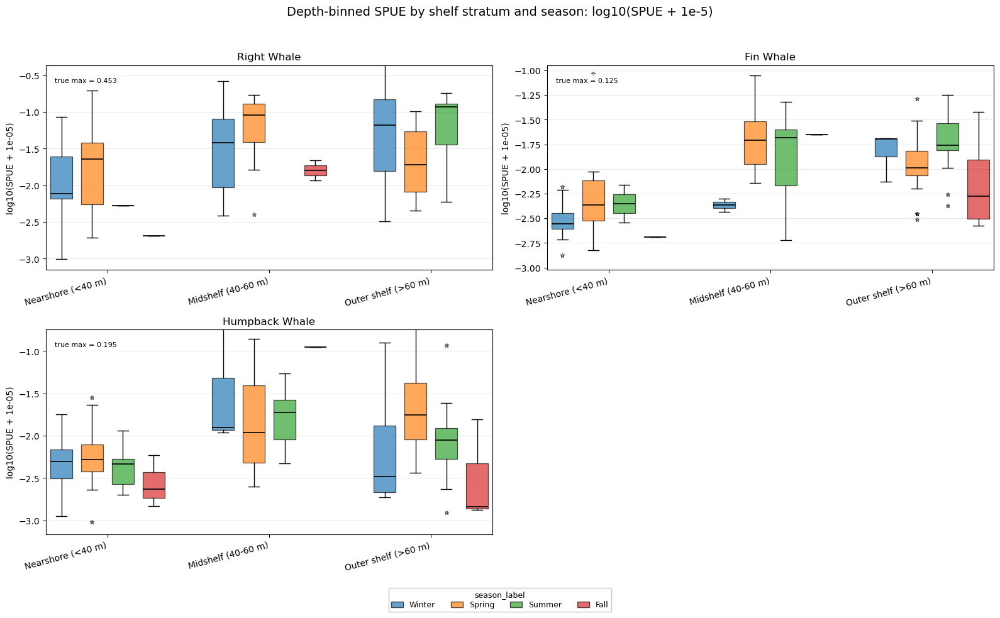

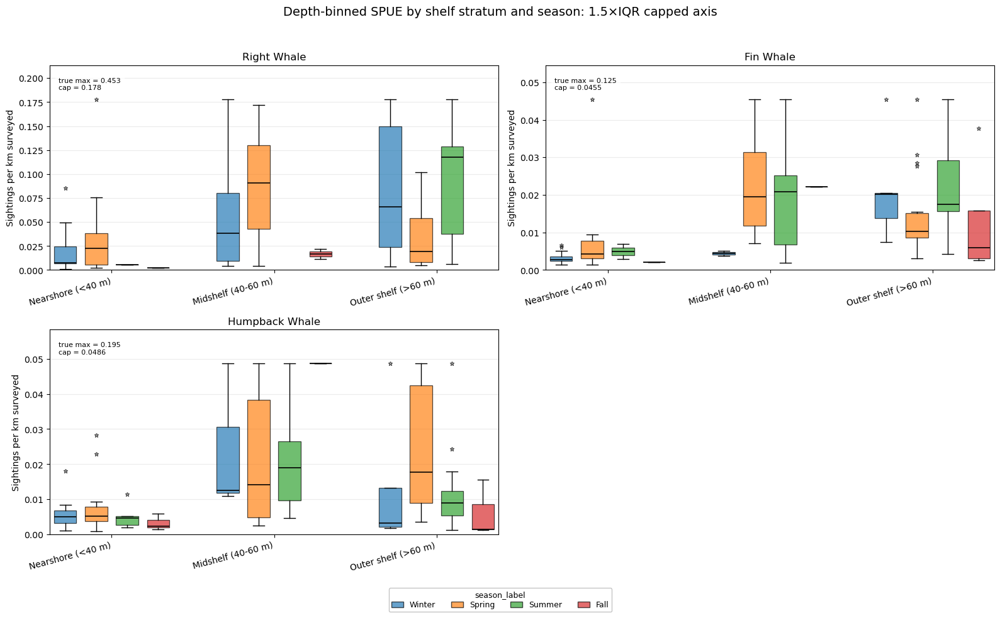

In [41]:
# ============================================================
# SPUE BOXPLOTS BY DEPTH STRATUM AND SEASON
# ============================================================
season_order = ["W", "Sp", "Su", "F"]
season_labels = {"W": "Winter", "Sp": "Spring", "Su": "Summer", "F": "Fall"}

plot_df_season = spue_by_stratum_daily.copy()
plot_df_season["season_label"] = plot_df_season["season"].map(season_labels)
season_label_order = [season_labels[s] for s in season_order]

# 1) Focused linear
grouped_boxplot(
    df=plot_df_season[plot_df_season["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="season_label",
    value_col="spue",
    x_order=stratum_order,
    hue_order=season_label_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="focused_linear",
    ylim_quantile=0.98,
    title="Depth-binned SPUE by shelf stratum and season: focused linear axis",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_season_main_species_FOCUSED_LINEAR.png"
)

# 2) Log transform
grouped_boxplot(
    df=plot_df_season[plot_df_season["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="season_label",
    value_col="spue",
    x_order=stratum_order,
    hue_order=season_label_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="log_transform",
    epsilon=1e-5,
    title="Depth-binned SPUE by shelf stratum and season: log10(SPUE + 1e-5)",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_season_main_species_LOG_TRANSFORM.png"
)

# 3) Capped
grouped_boxplot(
    df=plot_df_season[plot_df_season["SPCODE"].isin(main_species_for_strata)],
    panel_species=main_species_for_strata,
    x_col="stratum",
    hue_col="season_label",
    value_col="spue",
    x_order=stratum_order,
    hue_order=season_label_order,
    species_map=species_map,
    figsize=(16, 10),
    sharey=False,
    showfliers=True,
    method="capped",
    title="Depth-binned SPUE by shelf stratum and season: 1.5×IQR capped axis",
    outfile=SPATIAL_OUT / "spue_by_depth_stratum_by_season_main_species_CAPPED.png"
)

In [42]:
# ============================================================
# CHECK: raw sighting counts by stratum
# ============================================================
# These are NOT effort-standardized. Keep them as a diagnostic only.
# Use the SPUE plots above for thesis interpretation.

sightings_counts = (
    sightings_strata
    .groupby(["SPCODE", "year", "season", "stratum"], as_index=False, observed=True)
    .size()
    .rename(columns={"size": "n_sightings"})
)

print(sightings_counts.head())

  SPCODE  year season              stratum  n_sightings
0   BLWH  2023      F  Outer shelf (>60 m)            1
1   BLWH  2024     Su  Outer shelf (>60 m)            2
2   FIWH  2023      F   Midshelf (40-60 m)            1
3   FIWH  2023      F  Outer shelf (>60 m)           30
4   FIWH  2023     Sp    Nearshore (<40 m)            4


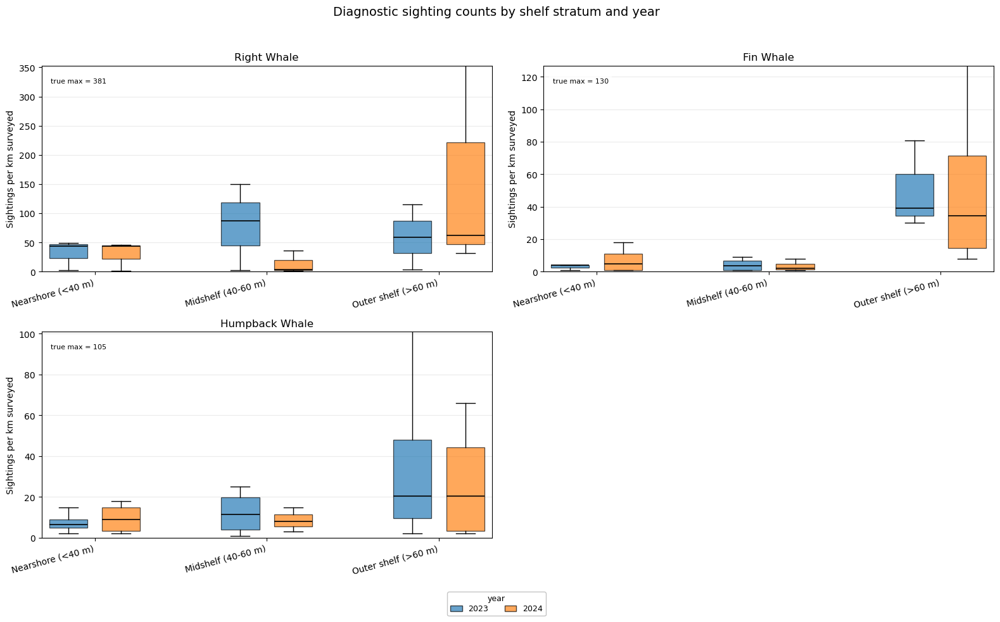

In [43]:
# ============================================================
# DIAGNOSTIC: TOTAL SIGHTING COUNTS BY STRATUM AND YEAR
# ============================================================
# This is deliberately labeled diagnostic because it is not effort-standardized.

main_species = ["RIWH", "FIWH", "HUWH"]

grouped_boxplot(
    df=sightings_counts,
    panel_species=main_species,
    x_col="stratum",
    hue_col="year",
    value_col="n_sightings",
    x_order=stratum_order,
    hue_order=ANALYSIS_YEARS,
    species_map=species_map,
    figsize=(16, 10),
    yscale="symlog",
    linthresh=1,
    showfliers=True,
    title="Diagnostic sighting counts by shelf stratum and year",
    outfile=SPATIAL_OUT / "diagnostic_sightings_by_stratum_and_year_symlog.png"
)

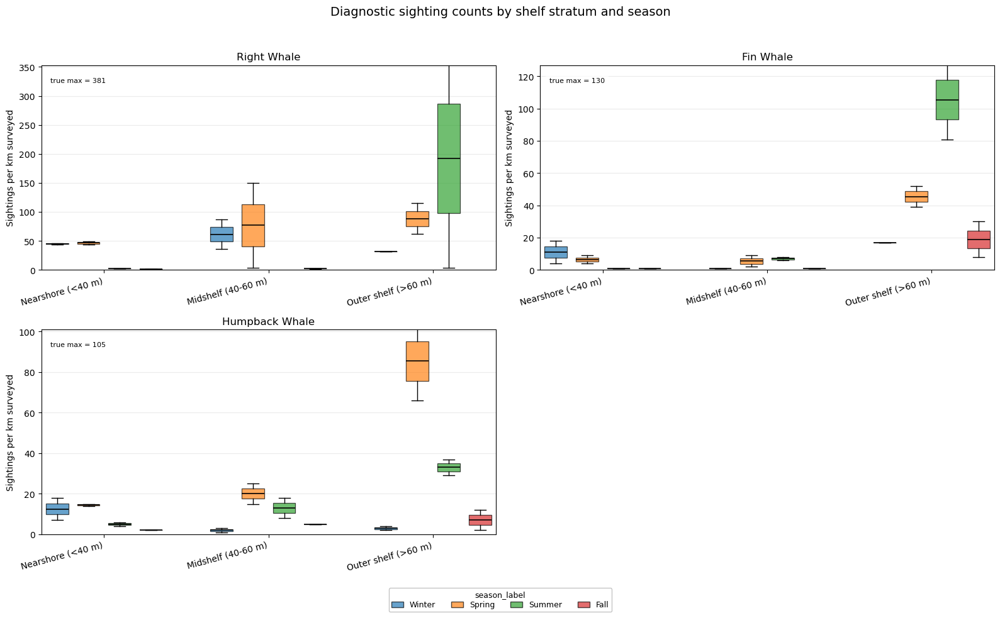

In [44]:
# ============================================================
# DIAGNOSTIC: TOTAL SIGHTING COUNTS BY STRATUM AND SEASON
# ============================================================
# This is deliberately labeled diagnostic because it is not effort-standardized.

plot_df = sightings_counts.copy()
plot_df["season_label"] = plot_df["season"].map(season_labels)

grouped_boxplot(
    df=plot_df,
    panel_species=main_species,
    x_col="stratum",
    hue_col="season_label",
    value_col="n_sightings",
    x_order=stratum_order,
    hue_order=season_label_order,
    species_map=species_map,
    figsize=(16, 10),
    yscale="symlog",
    linthresh=1,
    showfliers=True,
    title="Diagnostic sighting counts by shelf stratum and season",
    outfile=SPATIAL_OUT / "diagnostic_sightings_by_stratum_and_season_symlog.png"
)